# cWGAN with Gradient Penalty

In [1]:
from __future__ import print_function
#import argparse
import os
import random
import numpy as np

#import torch

import torch.nn.functional as F

import torch.multiprocessing as mp
mp.set_start_method('spawn')

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable, grad

import matplotlib.pyplot as plt
%matplotlib inline

import h5py

import itertools
from matplotlib.ticker import MultipleLocator
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.ticker import MultipleLocator
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors
import matplotlib as mpl
import timeit

import seaborn as sns

ngpu = 1   

import pandas as pd
from power_spectrum_utils import power_spectrum_np_2d
from wgan_utils import define_test, check_coords  #, get_samples
#from data_utils import get_max_cube, get_min_cube, get_mean_cube, get_stddev_cube
from plot_utils import hist_plot, plot_loss, plot_means
import pickle
from scipy.stats import kurtosis, skew

C:\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#Stats for 2d cubes (obtained by bootstrsaping, check 00_data_exploration.ipynb)
mean_5=14280.155
std_5=89914.586
max_5=47676240

#Stats for log
mean_l5 = 4.9034805
std_l5 = 2.3593297
max_l5 = 17.636091

#https://github.com/znxlwm/pytorch-MNIST-CelebA-cGAN-cDCGAN/blob/master/pytorch_CelebA_cDCGAN.py
#https://github.com/cameronfabbri/cWGANs/blob/master/fashion/mnist_cgan.py

In [3]:
class HydrogenDataset(Dataset):
    """Hydrogen Dataset"""

    def __init__(self, h5_file, s_test, s_sample, nsamples,transform, rotate, model):
        """
        Args:
            h5_file (string): name of the h5 file with 32 sampled cubes.
            root_dir (string): Directory with the .h5 file.
        """
        #file_size = os.path.getsize(root_dir + h5_file) / 1e6 # in MBs
        #print("The whole file size is " + str(int(file_size)) + " MBs")
        # self.subcubes = h5py.File('../data/sample_32.h5', 'r')
        self.s_test = s_test
        self.s_sample = s_sample
        self.t_coords = define_test(self.s_test,self.s_sample)
        self.nsamples = nsamples
        self.redshift = redshift
        self.transform=transform
        self.rotate=rotate
        self.file=h5_file
        self.model = model

    def __len__(self):
        # Function called when len(self) is executed
        return self.nsamples

    def __getitem__(self, idx):
        """
        This can be implemented in such a way that the whole h5 file read 
        using h5py.File() and get_sample() function is called to return
        a random subcube. This won't increase memory usage because the
        subcubes will be read in the same way and only the batch will
        be read into memory.
        
        Here we have implemented it so that it can be used with data
        generated by get_sample() function.
        
        The output of this function is one subcube with the dimensions
        specified by get_sample() implementation.
        """
        
        sample = get_samples(file = self.file,
                            s_sample = self.s_sample,
                             nsamples = 1,
                             test_coords = self.t_coords)
        #sample=sample.mean(axis=2)
        
        if self.rotate==True:
            t=random.randint(1,4)
            if t==4:
                sample=sample
            else:
                sample=np.rot90(sample, t, random.choice([(0,1), (1,0)]))
        
        if self.transform=='max':
            sample = sample / max_5
        if self.transform=='normalize':
            sample = (sample-mean_5)/std_5
        if self.transform=='clip_log':
            sample[sample <10**2]==0
            sample[sample > 3*std_5]==3*std_5
            sample=np.log(sample+1)
            
        if self.transform=='log':
            sample= np.log(sample)
            
        if self.transform=='log_norm':
            sample = (np.log(sample)-mean_l5) / std_l5
            
        if self.transform=='root':
            sample = (sample)**(1/4)
        if self.transform=='log_max':
            sample=np.log(sample) / max_l5
        #print(np.array(sample).shape)
        
        #Get label
        
        pred = predict_label(self.model, sample)

        #pred = [1 if x ==0 else 2 for x in pred ]
        
        sample=sample.reshape((1, self.s_sample, self.s_sample))

        return pred, torch.tensor(sample)

In [4]:
def predict_label(model, arr):
    vars_=['mean', 'std', 'kurtosis', 'skew', 'max']
    
    row = {'mean': arr.mean(), 'std': arr.std(), 'max': np.amax(arr), 
            'kurtosis': kurtosis(arr, axis=None), 'skew': kurtosis(arr, axis=None)}
        
    stats = pd.DataFrame(row, index=[1])
    pred = model.predict(stats)
    return pred

def plot_power_spec(real_cube,        # should be inverse_transformed
                    generated_cube,   # should be inverse_transformed
                    raw_cube_mean,
                   s_size,
                    threads=1, 
                    MAS="CIC", 
                    axis=0, 
                    BoxSize=75.0/2048*64):
    """Takes as input;
    - Real cube: (batch_size x 1 x n x n x n) torch cuda FloatTensor,
    - Generated copy: (batch_size x 1 x n x n x n) torch cuda FloatTensor,
    - constant assignments: threads, MAS, axis, BoxSize.
    
    Returns;
    - Power spectrum plots of both cubes
    in the same figure.
    """
    real_cube = real_cube.reshape(-1,
                                  1,
                                  real_cube.shape[2],
                                  real_cube.shape[2],
                                  real_cube.shape[2])
    generated_cube = generated_cube.reshape(-1,
                                            1,
                                            generated_cube.shape[2],
                                            generated_cube.shape[2],
                                            generated_cube.shape[2])
    
    #print("number of samples of real and generated cubes = " + str(real_cube.shape[0]))

    plt.figure(figsize=(16,8))

    for cube_no in range(real_cube.shape[0]):
        
        delta_real_cube = real_cube[cube_no][0]
        delta_gen_cube = generated_cube[cube_no][0]
        
        Pk_real, k_real = power_spectrum_np_2d(cube = delta_real_cube, mean_raw_cube = raw_cube_mean, SubBoxSize=s_size)
        Pk_gen,  k_gen = power_spectrum_np_2d(cube = delta_gen_cube,  mean_raw_cube = raw_cube_mean, SubBoxSize=s_size)
    
        plt.plot(np.log(k_real), np.log(Pk_real), color="b", 
                 alpha = 0.8, label="Real")
        plt.plot(np.log10(k_gen), np.log(Pk_gen), color="r",
                 alpha = 0.8, label="Generated")
        
        plt.rcParams["font.size"] = 16
        plt.title("Power Spectrum Comparison - (Blue: Real, Red: Noise-Generated)")
        plt.xlabel('logk')
        plt.ylabel('log(Pk.k3D)')
        #plt.xlim(0, 3)
#         plt.legend()
    
    #if save_plot:
     #   plt.savefig(redshift_fig_folder + 'powerspectrum_' + str(t) + '.png', 
      #              bbox_inches='tight')
   
    plt.show()
    #return np.log10(k_real), np.log10(k_gen)
    
    
def get_samples(file, s_sample, nsamples, test_coords):
    #n is size of minibatch, get valid samples (not intersecting with test_coords)
    sample_list=[]
    m=2048-s_sample
    for n in range(nsamples):
        #print("Sample No = " + str(n + 1) + " / " + str(nsamples))
        sample_valid=False
        while sample_valid==False:
            x = random.randint(0,m)
            y = random.randint(0,m)
            z = random.randint(0,m)
            sample_coords = {'x':[x,x+s_sample], 
                             'y':[y,y+s_sample], 
                             'z':[z,z+s_sample]}
            
            sample_valid = check_coords(test_coords, sample_coords)
        
        sample_list.append(sample_coords)
    
    #Load cube and get samples and convert them to np.arrays
    sample_array=[]
    #f file has to be opened outisde the function
    for c in sample_list:
        a = f[c['x'][0]:c['x'][1],
              c['y'][0]:c['y'][1],
              c['z'][0]:c['z'][1]]
        
        a = np.array(a).mean(axis=2)
        
        sample_array.append(a)
    
    return np.array(sample_array)

In [5]:
def visualize2d(real, fake,  log=False, save=''):
    min_= 0.0
    max_= 0.9
    #max_=(max_l5-mean_l5) / std_l5
    
    cols=8
    rows=2
    
    fig, axes = plt.subplots(nrows=2, ncols=cols, figsize=(16,4))
    
    for ax, row in zip(axes[:,0], ['Generated', 'Real']):
        ax.set_ylabel(row, rotation=90, fontsize=16)
    
    mf, mr=0,0
    for ax in axes.flat:
        #Plot only half of the mini-batch
        if mf<cols:
            if log==True:
                im = ax.imshow(np.log(fake[mf][0]), aspect='equal', cmap='viridis',
                       interpolation=None, vmin=min_, vmax=max_)
            else:
                im = ax.imshow((fake[mf][0]), aspect='equal',  cmap='viridis',
                       interpolation=None, vmin=min_, vmax=max_)
            mf+=1
        
        else:
            if log==True:
                im = ax.imshow(np.log(real[mr][0]), aspect='equal',  cmap='viridis',
                       interpolation=None, vmin=min_, vmax=max_)
            else:
                im = ax.imshow((real[mr][0]), aspect='equal',  cmap='viridis',
                       interpolation=None, vmin=min_, vmax=max_)
                
            mr+=1
        ax.set_xticks([])
        ax.set_yticks([])
    #fig.subplots_adjust(right=.8)
    #cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    #fig.colorbar(ax, cax=cbar_ax)
    fig.tight_layout() 
    if save!='':
        fig.savefig(save+'samples.png', dpi=1000)
           
    plt.show()  
    


    
def generate_images(G, no_images):
    #f file has to be opened globally
    dataloader = torch.utils.data.DataLoader(dataset, batch_size = 8,shuffle=False, num_workers=0, drop_last = True)
    data_iter = iter(dataloader)
    
    for n in range(no_images):
        #real  = get_samples(0, s_sample=s_sample, nsamples=8, test_coords={'x': [0, 1023], 'y': [0, 1023], 'z': [0, 1023]})
        #real=real.reshape(-1, 1 ,real.shape[2], real.shape[2], real.shape[2])  
        real = data_iter.next().numpy()
        
        noise = torch.FloatTensor(8, nz, 1 , 1).normal_(0, 1)
        fake = G(Variable(noise)).detach().numpy()
        
        visualize2d(real, fake, log= False, save='')     
    return



    
def plot_densities(fake, real, num_plots, log_):
    fig, ax = plt.subplots(figsize=(20,10))
    ax.plot(xlabel='big', ylabel='big', title='Density')
    sns.set(rc={'figure.figsize':(20,10),"lines.linewidth": 1})
    #plt.subplots(figsize=(20,10))
    ax.set_ylim(0,7)
    #ax.set_xlim(0, )
    bw=0.05
    eps=0
    grid=200
    n=0
    if log_==True:
        fake=np.log(fake+eps)
        real=np.log(real+eps)
    
    for m in range(fake.shape[0]):
        n+=1
        
        if m <= num_plots:
            if n==1:
                sns.kdeplot(fake[m][0].flatten(), ax=ax, bw=bw, label='Generated', color='red');
                sns.kdeplot(real[m][0].flatten(), ax=ax, bw=bw,  label='Real' ,   color='blue');
            else:
                sns.kdeplot(fake[m][0].flatten(), ax=ax, bw=bw, color='red');
                sns.kdeplot(real[m][0].flatten(), ax=ax, bw=bw, color='blue');
        
        ax.set_title("Densities of log HI mass",fontsize=25)
        ax.tick_params(labelsize=20)
        plt.setp(ax.get_legend().get_texts(), fontsize='20')
    plt.show()
    
    
    
def plot_power_spec2(real_cube, generated_cube,  
                    raw_cube_mean,
                    s_size,
                    threads=1, 
                    MAS="CIC", 
                    axis=0, 
                    BoxSize=75.0/2048.0*64):

    plt.figure(figsize=(15,10))
    
    kmax =  0
    Pk_max =None
    kmin = 9000000000000
    Pk_min=  None
    
    for cube_no in range(generated_cube.shape[0]):
        
        delta_real_cube = real_cube[cube_no][0]
        delta_gen_cube = generated_cube[cube_no][0]
        
        k_real ,Pk_real = power_spectrum_np_2d(cube = delta_real_cube, mean_raw_cube = raw_cube_mean, 
                                            SubBoxSize= BoxSize)
      
        if Pk_real[0] >= kmax:
            Pkmax = Pk_real
            kmax = Pk_real[0]
        if Pk_real[0] <= kmin:
            Pkmin = Pk_real
            kmin = Pk_real[0]
        
        
        k_gen,  Pk_gen  = power_spectrum_np_2d(cube = delta_gen_cube,  mean_raw_cube = raw_cube_mean, 
                                            SubBoxSize= BoxSize)
        
        
        if cube_no==0:
            plt.plot(k_gen, Pk_gen, color="r", alpha = 0.3,  linewidth = 2, label='Generated')
        else:
            plt.plot(k_gen, Pk_gen, color="r", alpha = 0.3,  linewidth = 2)
        
    plt.plot(k_gen, Pkmax, color='b', alpha =0.6, linewidth = 2, label='Max of real samples' )   
    plt.plot(k_gen, Pkmin, color='b', alpha =0.6, linewidth = 2, label='Min of real samples' ) 
    
    
    plt.rcParams["font.size"] = 20
    plt.title("Power Spectrum Comparison - (Blue: Real, Red: Generated)")
    plt.xlabel('logk')
    plt.ylabel('log(Pk.k3D)')
    
    
        #plt.xlim(0, 3)
    plt.legend(fontsize=16, loc='best')
    plt.xscale('log')
    plt.yscale('log')
    
    plt.title('Power Spectrums')
    
    #if save_plot:
     #   plt.savefig(redshift_fig_folder + 'powerspectrum_' + str(t) + '.png', 
      #              bbox_inches='tight')
   
    plt.show()

In [6]:
#https://github.com/EmilienDupont/wgan-gp/blob/master/training.py
def _gradient_penalty(real_data, generated_data, y, gp_weight):
        batch_size = real_data.size()[0]

        # Calculate interpolation
        alpha = torch.rand(batch_size, 1, 1, 1)
        alpha = alpha.expand_as(real_data)
        if cuda:
            alpha = alpha.cuda()
        interpolated = alpha * real_data.data + (1 - alpha) * generated_data.data
        interpolated = Variable(interpolated, requires_grad=True)
        if cuda:
            interpolated = interpolated.cuda()

        # Calculate probability of interpolated examples
        prob_interpolated = netD(interpolated,y)

        # Calculate gradients of probabilities with respect to examples
        gradients = grad(outputs=prob_interpolated, inputs=interpolated,
                               grad_outputs=torch.ones(prob_interpolated.size()).cuda() if cuda else torch.ones(
                               prob_interpolated.size()),
                               create_graph=True, retain_graph=True)[0]

        # Gradients have shape (batch_size, num_channels, img_width, img_height),
        # so flatten to easily take norm per example in batch
        gradients = gradients.view(batch_size, -1)
        #self.losses['gradient_norm'].append(gradients.norm(2, dim=1).mean().data[0])

        # Derivatives of the gradient close to 0 can cause problems because of
        # the square root, so manually calculate norm and add epsilon
        gradients_norm = torch.sqrt(torch.sum(gradients ** 2, dim=1) + 1e-12)

        # Return gradient penalty
        return gp_weight * ((gradients_norm - 1) ** 2).mean()

In [9]:
class generator(nn.Module):
    # initializers
    def __init__(self, d=128):
        super(generator, self).__init__()
        self.deconv1_1 = nn.ConvTranspose2d(100, d*4, 4, 1, 0)
        self.deconv1_1_bn = nn.BatchNorm2d(d*4)
        self.deconv1_2 = nn.ConvTranspose2d(2, d*4, 4, 1, 0)
        self.deconv1_2_bn = nn.BatchNorm2d(d*4)
        self.deconv2 = nn.ConvTranspose2d(d*8, d*4, 4, 2, 1)
        self.deconv2_bn = nn.BatchNorm2d(d*4)
        self.deconv3 = nn.ConvTranspose2d(d*4, d*2, 4, 2, 1)
        self.deconv3_bn = nn.BatchNorm2d(d*2)
        # self.deconv4 = nn.ConvTranspose2d(d, 3, 4, 2, 1)
        self.deconv4 = nn.ConvTranspose2d(d*2, d, 4, 2, 1)
        self.deconv4_bn = nn.BatchNorm2d(d)
        self.deconv5 = nn.ConvTranspose2d(d, 1, 4, 2, 1)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    # def forward(self, input):
    def forward(self, input, label):
        x = F.leaky_relu(self.deconv1_1_bn(self.deconv1_1(input)), 0.2)
        y = F.leaky_relu(self.deconv1_2_bn(self.deconv1_2(label)), 0.2)
        x = torch.cat([x, y], 1)
        x = F.leaky_relu(self.deconv2_bn(self.deconv2(x)), 0.2)
        x = F.leaky_relu(self.deconv3_bn(self.deconv3(x)), 0.2)
        # x = F.tanh(self.deconv4(x))
        x = F.leaky_relu(self.deconv4_bn(self.deconv4(x)), 0.2)
        x = F.sigmoid(self.deconv5(x))

        return x

class discriminator(nn.Module):
    # initializers
    def __init__(self, d=128):
        super(discriminator, self).__init__()
        self.conv1_1 = nn.Conv2d(1, d//2, 4, 2, 1)
        self.conv1_2 = nn.Conv2d(2, d//2, 4, 2, 1)
        self.conv2 = nn.Conv2d(d, d*2, 4, 2, 1)
        #self.conv2_bn = nn.BatchNorm2d(d*2)
        self.conv3 = nn.Conv2d(d*2, d*4, 4, 2, 1)
        #self.conv3_bn = nn.BatchNorm2d(d*4)
        # self.conv4 = nn.Conv2d(d*4, 1, 4, 1, 0)
        self.conv4 = nn.Conv2d(d*4, d*8, 4, 2, 1)
        #self.conv4_bn = nn.BatchNorm2d(d*8)
        self.conv5 = nn.Conv2d(d*8, 1, 4, 1, 0)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    # def forward(self, input):
    def forward(self, input, label):
        x = F.leaky_relu(self.conv1_1(input), 0.2)
        y = F.leaky_relu(self.conv1_2(label), 0.2)
        x = torch.cat([x, y], 1)
        x = F.leaky_relu((self.conv2(x)), 0.2)
        x = F.leaky_relu((self.conv3(x)), 0.2)
        # x = F.sigmoid(self.conv4(x))
        x = F.leaky_relu((self.conv4(x)), 0.2)
        x = self.conv5(x)
        
        x = x.mean(0)
        return x.view(1)

In [10]:
def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

def show_noise_morp(show=False, save=False, path='result.png'):
    source_z_ = torch.randn(10, 100)
    z_ = torch.zeros(100, 100)
    for i in range(5):
        for j in range(10):
            z_[i*20 + j] = (source_z_[i*2+1] - source_z_[i*2]) / 9 * (j+1) + source_z_[i*2]

    for i in range(5):
        z_[i*20+10:i*20+20] = z_[i*20:i*20+10]

    y_ = torch.cat([torch.zeros(10, 1), torch.ones(10, 1)], 0).type(torch.LongTensor).squeeze()
    y_ = torch.cat([y_, y_, y_, y_, y_], 0)
    y_label_ = onehot[y_]
    z_ = z_.view(-1, 100, 1, 1)
    y_label_ = y_label_.view(-1, 2, 1, 1)

    z_, y_label_ = Variable(z_.cuda(), volatile=True), Variable(y_label_.cuda(), volatile=True)

    G.eval()
    test_images = netG(z_, y_label_)
    netG.train()

    size_figure_grid = 10
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(img_size, img_size))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i, j].get_xaxis().set_visible(False)
        ax[i, j].get_yaxis().set_visible(False)

    for k in range(10 * 10):
        i = k // 10
        j = k % 10
        ax[i, j].cla()
        ax[i, j].imshow((test_images[k].cpu().data.numpy().transpose(1, 2, 0) + 1) / 2)

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

In [11]:
redshift='5.0'
cuda=True
n_samples = 64000
s_sample =64
batchSize = 64
img_size = s_sample

num_labels = 2
nz=100 

nc=1
ngf= 128 #256
ndf = ngf

# 64*64
n_extra_layers_D=0
n_extra_layers_G=0

niter=100
Diters_init=5

#manualSeed = 1   # 'manual seed'
random.seed(1)
#.0002
#Default: 0.00005 / Adam .0001
lrD = 0.00001
lrG = 0.00001

#Clamp weights or use GP
#clamp_lower = -.012 #Default .01
#clamp_upper = .012
lambda_ = 10

device = torch.device("cuda:0" if cuda else "cpu")
experiment='first_iteration'

DCGAN=True
#DC
if DCGAN == True:
    netG = generator(int(ngf))
    netD = discriminator(int(ndf))
    netG.weight_init(mean=0.0, std=0.02)
    netD.weight_init(mean=0.0, std=0.02)
    #netG = DCGAN_G(s_sample, nz +num_labels, z, nc, ngf, ngpu, n_extra_layers_G)
    #netD = DCGAN_D(s_sample, nz+ num_labels, nc, ndf, ngpu, n_extra_layers_D)
#MLP
else:
    netG = MLP_G(s_sample, nz, nc, ngf, ngpu)
    netD = MLP_D(s_sample, nz, nc, ndf, ngpu)
#D:\Documentos\NYU\3rdTerm\Capstone\HydroGAN\WGAN\first_iteration\saved\DCGAN2D\Cond
netG_arg = "first_iteration/saved/DCGAN2D/Cond/netG_epoch_68.pth"        # "path to netG (to continue training) "
netD_arg = "first_iteration/saved/DCGAN2D/Cond/netD_epoch_68.pth"  
#netG_arg = ''
#netD_arg = ''

#netG.apply(weights_init)
#netD.apply(weights_init)


if netG_arg != '':
    netG.load_state_dict(torch.load(netG_arg))

if netD_arg != '':
    netD.load_state_dict(torch.load(netD_arg))


gmm_model = pickle.load(open('gmm.sav', 'rb'))

datapath='../../../../../'
f = h5py.File(datapath+'fields_z='+redshift+'.hdf5', 'r')
f=f['delta_HI']
    
dataset = HydrogenDataset(h5_file = 0,
                            s_test = 1024, 
                            s_sample = s_sample, 
                            nsamples = n_samples, 
                            transform = 'log_max',
                            rotate = True,
                            model = gmm_model )

workers=0
dataloader = torch.utils.data.DataLoader(dataset, 
                                         #batch_size=opt.batchSize,
                                         batch_size = batchSize,
                                         shuffle=False, 
                                         #num_workers=int(opt.workers)
                                         num_workers=int(workers),
                                        drop_last = True)

print(netG)
print(netD)
#https://github.com/znxlwm/pytorch-MNIST-CelebA-cGAN-cDCGAN/blob/master/pytorch_CelebA_cDCGAN.py

generator(
  (deconv1_1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
  (deconv1_1_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv1_2): ConvTranspose2d(2, 512, kernel_size=(4, 4), stride=(1, 1))
  (deconv1_2_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv2): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv2_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv3_bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv4): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv4_bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv5): ConvTranspose2d(128, 1, kernel_size=(4, 4), stride=(2, 2), padding

C:\Anaconda3\lib\site-packages\torch\nn\functional.py:1006: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[0/100][100/1000][1] Loss_D: -740.359375 Loss_G: -699895.437500 Loss_D_real: -197226.406250 Loss_D_fake -196486.046875
[0/100][200/1000][2] Loss_D: -686.890625 Loss_G: -660431.000000 Loss_D_real: -202401.453125 Loss_D_fake -201714.562500
[0/100][205/1000][3] Loss_D: -667.562500 Loss_G: -674402.750000 Loss_D_real: -199695.546875 Loss_D_fake -199027.984375
[0/100][210/1000][4] Loss_D: -737.531250 Loss_G: -745663.000000 Loss_D_real: -202104.343750 Loss_D_fake -201366.812500
[0/100][215/1000][5] Loss_D: -639.421875 Loss_G: -658960.687500 Loss_D_real: -220751.718750 Loss_D_fake -220112.296875
[0/100][220/1000][6] Loss_D: -691.031250 Loss_G: -673747.000000 Loss_D_real: -253431.656250 Loss_D_fake -252740.625000
[0/100][225/1000][7] Loss_D: -796.890625 Loss_G: -660004.500000 Loss_D_real: -188810.687500 Loss_D_fake -188013.796875
[0/100][230/1000][8] Loss_D: -763.281250 Loss_G: -674061.312500 Loss_D_real: -186443.562500 Loss_D_fake -185680.281250
[0/100][235/1000][9] Loss_D: -637.062500 Loss_G:

[0/100][540/1000][70] Loss_D: -634.234375 Loss_G: -645625.687500 Loss_D_real: -218810.296875 Loss_D_fake -218176.062500
[0/100][545/1000][71] Loss_D: -739.171875 Loss_G: -680314.875000 Loss_D_real: -169570.156250 Loss_D_fake -168830.984375
[0/100][550/1000][72] Loss_D: -589.906250 Loss_G: -734302.000000 Loss_D_real: -220087.078125 Loss_D_fake -219497.171875
[0/100][555/1000][73] Loss_D: -640.281250 Loss_G: -784144.750000 Loss_D_real: -169575.343750 Loss_D_fake -168935.062500
[0/100][560/1000][74] Loss_D: -677.625000 Loss_G: -652483.937500 Loss_D_real: -203989.484375 Loss_D_fake -203311.859375
[0/100][565/1000][75] Loss_D: -661.390625 Loss_G: -622779.812500 Loss_D_real: -223763.031250 Loss_D_fake -223101.640625
[0/100][570/1000][76] Loss_D: -935.468750 Loss_G: -729191.562500 Loss_D_real: -243511.796875 Loss_D_fake -242576.328125
[0/100][575/1000][77] Loss_D: -645.328125 Loss_G: -714669.875000 Loss_D_real: -188961.546875 Loss_D_fake -188316.218750
[0/100][580/1000][78] Loss_D: -731.73437

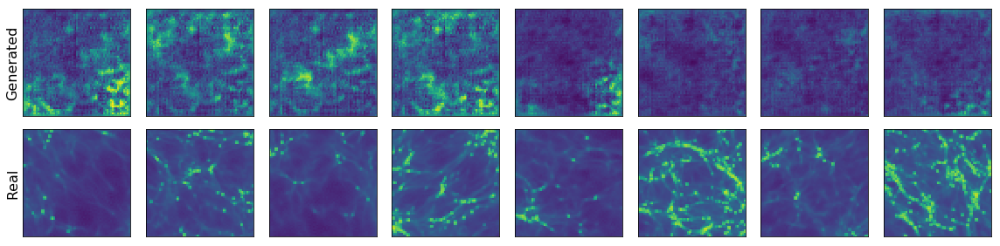

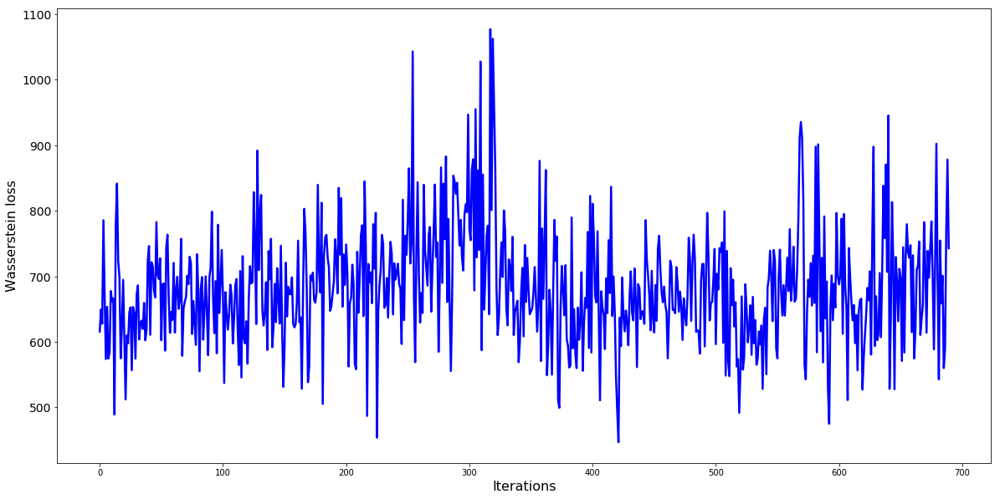

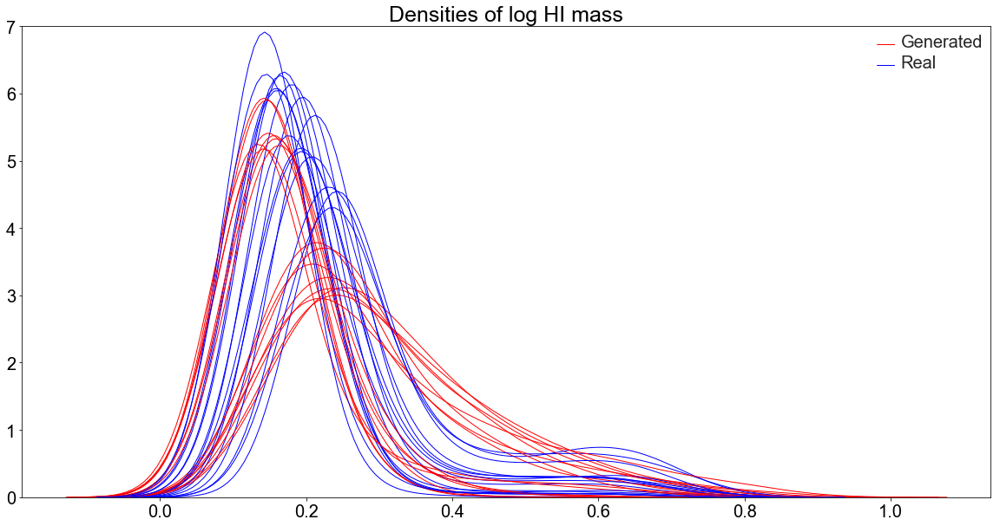

[0/100][695/1000][101] Loss_D: -752.390625 Loss_G: -596090.875000 Loss_D_real: -204032.328125 Loss_D_fake -203279.937500
[0/100][700/1000][102] Loss_D: -771.890625 Loss_G: -696644.187500 Loss_D_real: -155563.343750 Loss_D_fake -154791.453125
[0/100][705/1000][103] Loss_D: -839.437500 Loss_G: -672626.687500 Loss_D_real: -172111.250000 Loss_D_fake -171271.812500
[0/100][710/1000][104] Loss_D: -702.781250 Loss_G: -635067.125000 Loss_D_real: -171225.234375 Loss_D_fake -170522.453125
[0/100][715/1000][105] Loss_D: -634.906250 Loss_G: -676378.187500 Loss_D_real: -256853.875000 Loss_D_fake -256218.968750
[0/100][720/1000][106] Loss_D: -735.046875 Loss_G: -773189.750000 Loss_D_real: -206867.921875 Loss_D_fake -206132.875000
[0/100][725/1000][107] Loss_D: -595.578125 Loss_G: -574333.750000 Loss_D_real: -223054.062500 Loss_D_fake -222458.484375
[0/100][730/1000][108] Loss_D: -760.625000 Loss_G: -658432.187500 Loss_D_real: -175485.484375 Loss_D_fake -174724.859375
[0/100][735/1000][109] Loss_D: -

[1/100][35/1000][169] Loss_D: -642.187500 Loss_G: -568591.812500 Loss_D_real: -199575.625000 Loss_D_fake -198933.437500
[1/100][40/1000][170] Loss_D: -728.453125 Loss_G: -710849.625000 Loss_D_real: -166987.296875 Loss_D_fake -166258.843750
[1/100][45/1000][171] Loss_D: -755.562500 Loss_G: -613611.875000 Loss_D_real: -229936.296875 Loss_D_fake -229180.734375
[1/100][50/1000][172] Loss_D: -754.843750 Loss_G: -727978.625000 Loss_D_real: -230529.703125 Loss_D_fake -229774.859375
[1/100][55/1000][173] Loss_D: -832.062500 Loss_G: -710073.500000 Loss_D_real: -165593.203125 Loss_D_fake -164761.140625
[1/100][60/1000][174] Loss_D: -701.500000 Loss_G: -613103.125000 Loss_D_real: -245697.734375 Loss_D_fake -244996.234375
[1/100][65/1000][175] Loss_D: -723.203125 Loss_G: -603085.750000 Loss_D_real: -199028.359375 Loss_D_fake -198305.156250
[1/100][70/1000][176] Loss_D: -889.781250 Loss_G: -588186.312500 Loss_D_real: -166810.609375 Loss_D_fake -165920.828125
[1/100][75/1000][177] Loss_D: -518.43750

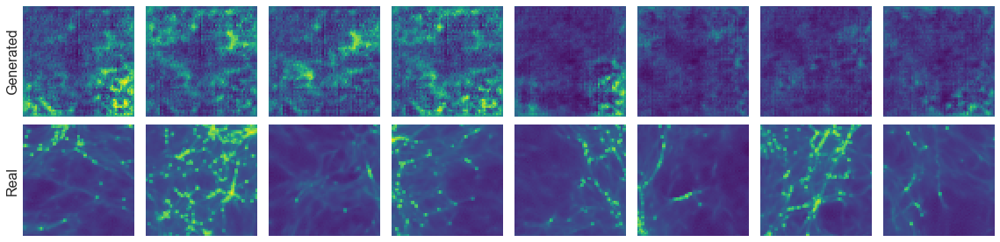

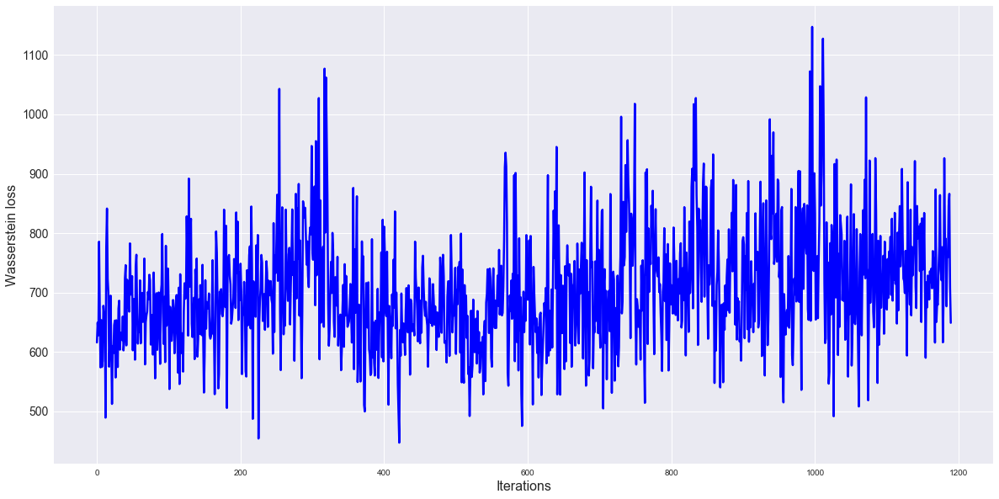

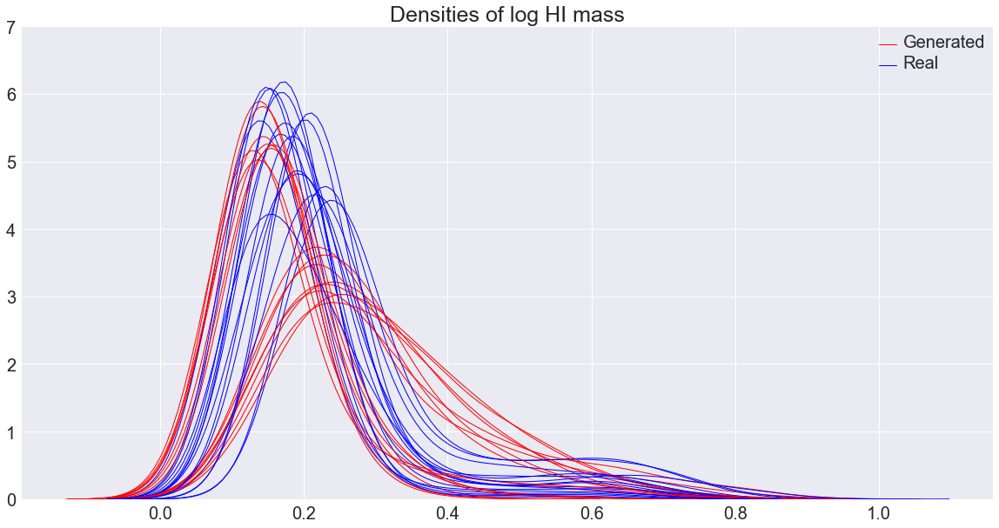

[1/100][195/1000][201] Loss_D: -821.265625 Loss_G: -613301.750000 Loss_D_real: -180274.625000 Loss_D_fake -179453.359375
[1/100][200/1000][202] Loss_D: -571.765625 Loss_G: -697098.875000 Loss_D_real: -214204.328125 Loss_D_fake -213632.562500
[1/100][205/1000][203] Loss_D: -726.015625 Loss_G: -755239.062500 Loss_D_real: -199670.171875 Loss_D_fake -198944.156250
[1/100][210/1000][204] Loss_D: -667.015625 Loss_G: -585541.625000 Loss_D_real: -182940.328125 Loss_D_fake -182273.312500
[1/100][215/1000][205] Loss_D: -743.500000 Loss_G: -599180.437500 Loss_D_real: -181125.515625 Loss_D_fake -180382.015625
[1/100][220/1000][206] Loss_D: -599.218750 Loss_G: -795281.375000 Loss_D_real: -165770.203125 Loss_D_fake -165170.984375
[1/100][225/1000][207] Loss_D: -606.734375 Loss_G: -504233.875000 Loss_D_real: -198808.421875 Loss_D_fake -198201.687500
[1/100][230/1000][208] Loss_D: -765.328125 Loss_G: -725528.062500 Loss_D_real: -165694.515625 Loss_D_fake -164929.187500
[1/100][235/1000][209] Loss_D: -

[1/100][535/1000][269] Loss_D: -720.156250 Loss_G: -686226.875000 Loss_D_real: -165952.437500 Loss_D_fake -165232.281250
[1/100][540/1000][270] Loss_D: -671.281250 Loss_G: -574613.125000 Loss_D_real: -200597.640625 Loss_D_fake -199926.359375
[1/100][545/1000][271] Loss_D: -1016.734375 Loss_G: -638808.625000 Loss_D_real: -214964.390625 Loss_D_fake -213947.656250
[1/100][550/1000][272] Loss_D: -841.125000 Loss_G: -583283.500000 Loss_D_real: -179159.781250 Loss_D_fake -178318.656250
[1/100][555/1000][273] Loss_D: -724.046875 Loss_G: -624538.937500 Loss_D_real: -160725.718750 Loss_D_fake -160001.671875
[1/100][560/1000][274] Loss_D: -510.828125 Loss_G: -629093.375000 Loss_D_real: -189176.546875 Loss_D_fake -188665.718750
[1/100][565/1000][275] Loss_D: -646.234375 Loss_G: -614394.437500 Loss_D_real: -172893.546875 Loss_D_fake -172247.312500
[1/100][570/1000][276] Loss_D: -654.328125 Loss_G: -571542.625000 Loss_D_real: -175621.734375 Loss_D_fake -174967.406250
[1/100][575/1000][277] Loss_D: 

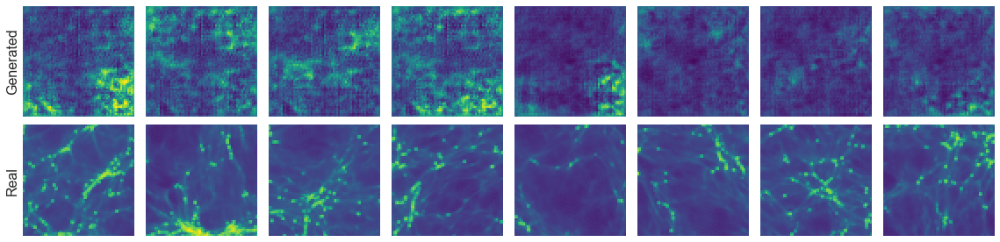

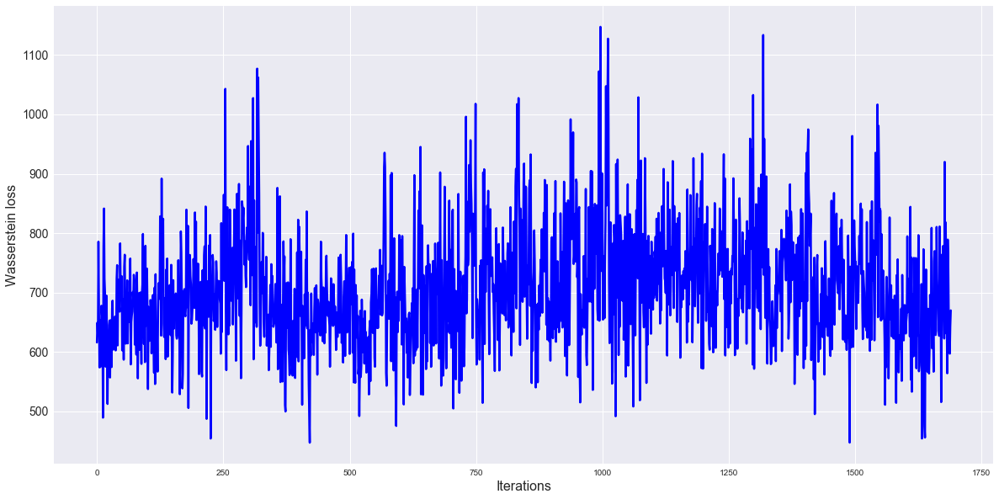

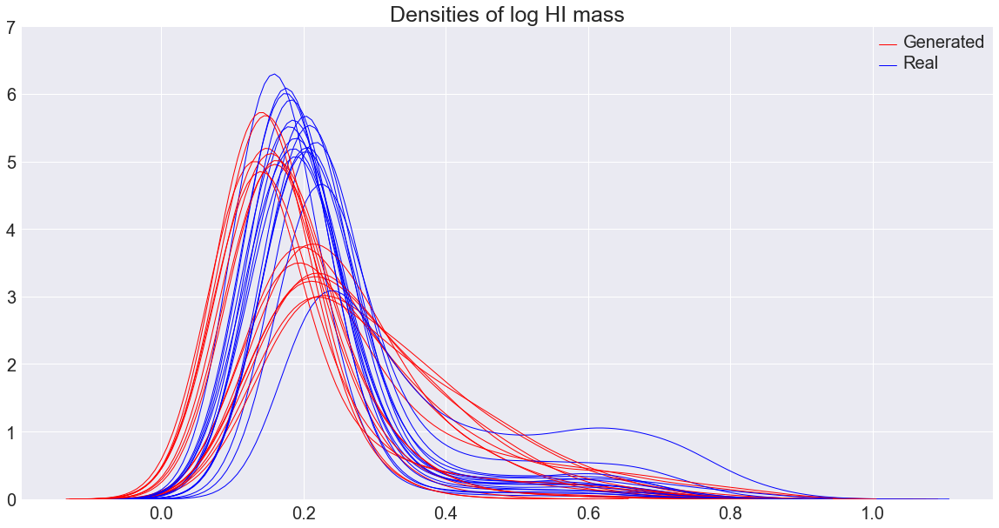

[1/100][695/1000][301] Loss_D: -607.468750 Loss_G: -556567.125000 Loss_D_real: -158949.375000 Loss_D_fake -158341.906250
[1/100][700/1000][302] Loss_D: -609.656250 Loss_G: -770064.625000 Loss_D_real: -155919.437500 Loss_D_fake -155309.781250
[1/100][705/1000][303] Loss_D: -723.125000 Loss_G: -630815.000000 Loss_D_real: -157606.000000 Loss_D_fake -156882.875000
[1/100][710/1000][304] Loss_D: -538.625000 Loss_G: -737590.687500 Loss_D_real: -188561.046875 Loss_D_fake -188022.421875
[1/100][715/1000][305] Loss_D: -560.156250 Loss_G: -734912.875000 Loss_D_real: -169894.078125 Loss_D_fake -169333.921875
[1/100][720/1000][306] Loss_D: -652.796875 Loss_G: -571312.937500 Loss_D_real: -205711.453125 Loss_D_fake -205058.656250
[1/100][725/1000][307] Loss_D: -680.718750 Loss_G: -637195.812500 Loss_D_real: -161610.734375 Loss_D_fake -160930.015625
[1/100][730/1000][308] Loss_D: -607.250000 Loss_G: -680161.312500 Loss_D_real: -222397.656250 Loss_D_fake -221790.406250
[1/100][735/1000][309] Loss_D: -

[2/100][35/1000][369] Loss_D: -651.312500 Loss_G: -706229.125000 Loss_D_real: -242670.875000 Loss_D_fake -242019.562500
[2/100][40/1000][370] Loss_D: -788.156250 Loss_G: -677396.875000 Loss_D_real: -243086.687500 Loss_D_fake -242298.531250
[2/100][45/1000][371] Loss_D: -782.078125 Loss_G: -681766.812500 Loss_D_real: -227272.640625 Loss_D_fake -226490.562500
[2/100][50/1000][372] Loss_D: -742.250000 Loss_G: -589086.375000 Loss_D_real: -229365.046875 Loss_D_fake -228622.796875
[2/100][55/1000][373] Loss_D: -563.109375 Loss_G: -758683.125000 Loss_D_real: -229223.187500 Loss_D_fake -228660.078125
[2/100][60/1000][374] Loss_D: -843.312500 Loss_G: -590871.062500 Loss_D_real: -265644.500000 Loss_D_fake -264801.187500
[2/100][65/1000][375] Loss_D: -795.250000 Loss_G: -625038.687500 Loss_D_real: -333639.000000 Loss_D_fake -332843.750000
[2/100][70/1000][376] Loss_D: -598.937500 Loss_G: -659194.875000 Loss_D_real: -232384.109375 Loss_D_fake -231785.171875
[2/100][75/1000][377] Loss_D: -773.00000

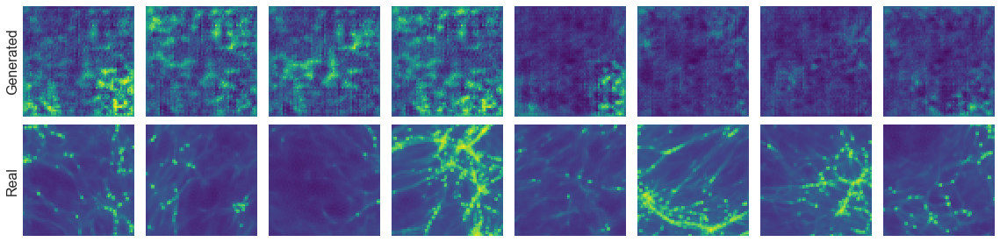

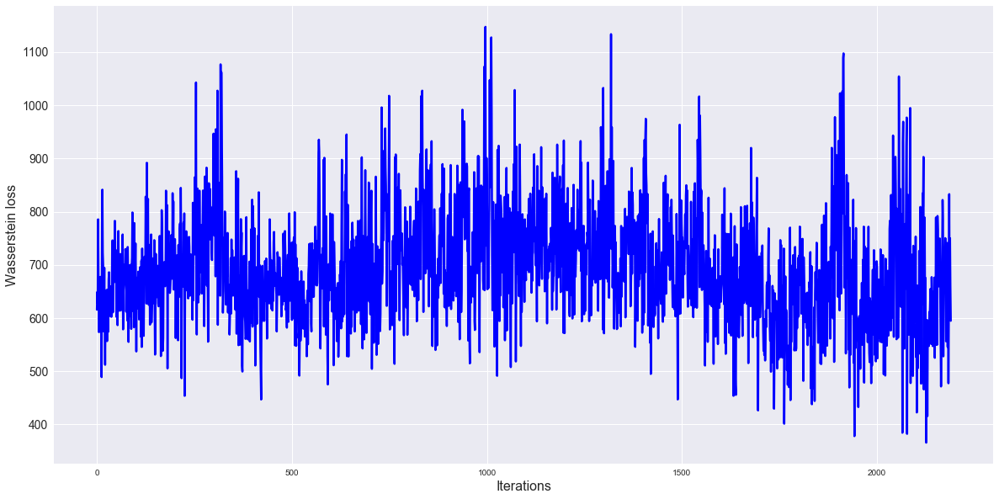

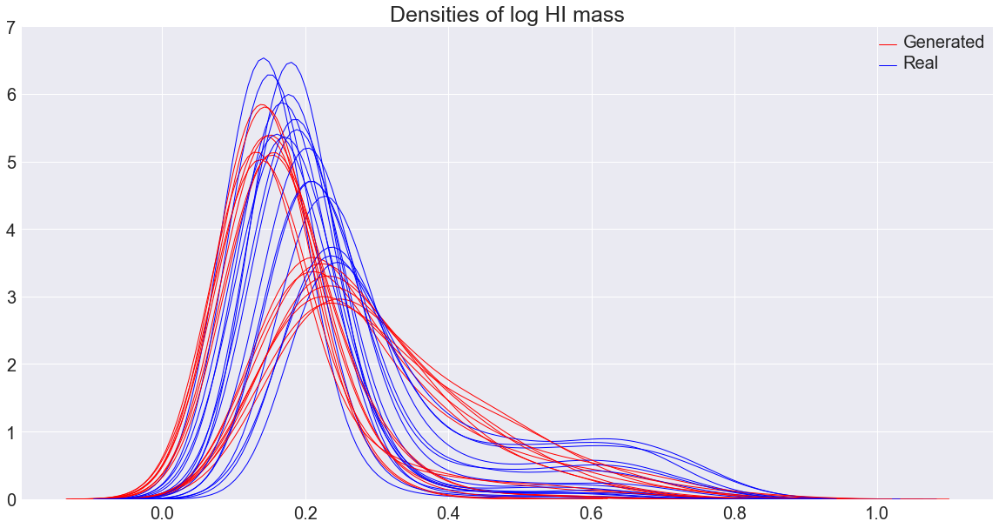

[2/100][290/1000][401] Loss_D: -923.390625 Loss_G: -838648.812500 Loss_D_real: -222542.843750 Loss_D_fake -221619.453125
[2/100][295/1000][402] Loss_D: -664.000000 Loss_G: -768007.125000 Loss_D_real: -171075.546875 Loss_D_fake -170411.546875
[2/100][300/1000][403] Loss_D: -661.265625 Loss_G: -789743.062500 Loss_D_real: -188714.640625 Loss_D_fake -188053.375000
[2/100][305/1000][404] Loss_D: -578.281250 Loss_G: -669565.375000 Loss_D_real: -172380.312500 Loss_D_fake -171802.031250
[2/100][310/1000][405] Loss_D: -786.375000 Loss_G: -757134.937500 Loss_D_real: -208891.328125 Loss_D_fake -208104.953125
[2/100][315/1000][406] Loss_D: -748.078125 Loss_G: -665458.875000 Loss_D_real: -257912.171875 Loss_D_fake -257164.093750
[2/100][320/1000][407] Loss_D: -629.156250 Loss_G: -779220.312500 Loss_D_real: -188806.921875 Loss_D_fake -188177.765625
[2/100][325/1000][408] Loss_D: -697.843750 Loss_G: -718574.687500 Loss_D_real: -199581.812500 Loss_D_fake -198883.968750
[2/100][330/1000][409] Loss_D: -

[2/100][630/1000][469] Loss_D: -624.500000 Loss_G: -677460.312500 Loss_D_real: -211240.625000 Loss_D_fake -210616.125000
[2/100][635/1000][470] Loss_D: -702.250000 Loss_G: -655269.125000 Loss_D_real: -272917.937500 Loss_D_fake -272215.687500
[2/100][640/1000][471] Loss_D: -591.796875 Loss_G: -646484.187500 Loss_D_real: -253105.640625 Loss_D_fake -252513.843750
[2/100][645/1000][472] Loss_D: -641.156250 Loss_G: -560966.562500 Loss_D_real: -171350.218750 Loss_D_fake -170709.062500
[2/100][650/1000][473] Loss_D: -771.671875 Loss_G: -679356.187500 Loss_D_real: -175286.265625 Loss_D_fake -174514.593750
[2/100][655/1000][474] Loss_D: -558.437500 Loss_G: -657624.812500 Loss_D_real: -218675.328125 Loss_D_fake -218116.890625
[2/100][660/1000][475] Loss_D: -541.468750 Loss_G: -785797.812500 Loss_D_real: -171166.625000 Loss_D_fake -170625.156250
[2/100][665/1000][476] Loss_D: -647.843750 Loss_G: -808054.937500 Loss_D_real: -204406.750000 Loss_D_fake -203758.906250
[2/100][670/1000][477] Loss_D: -

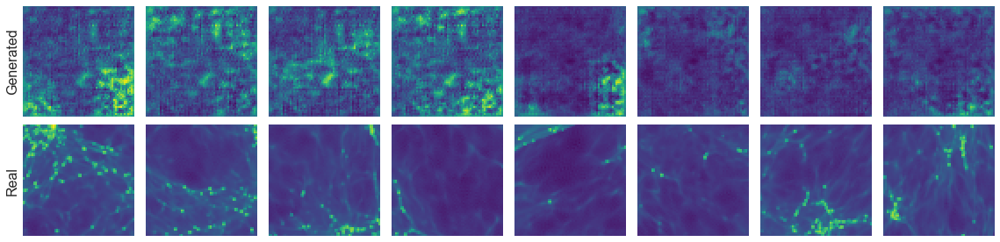

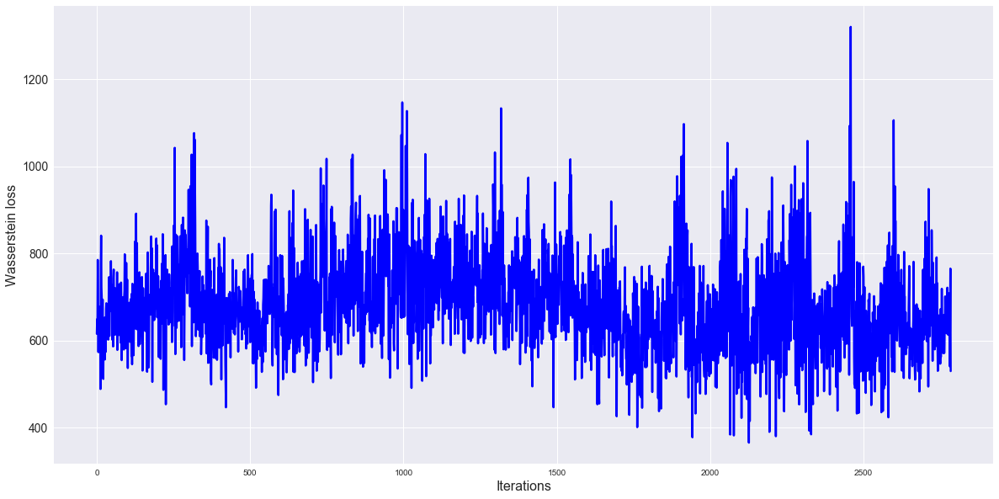

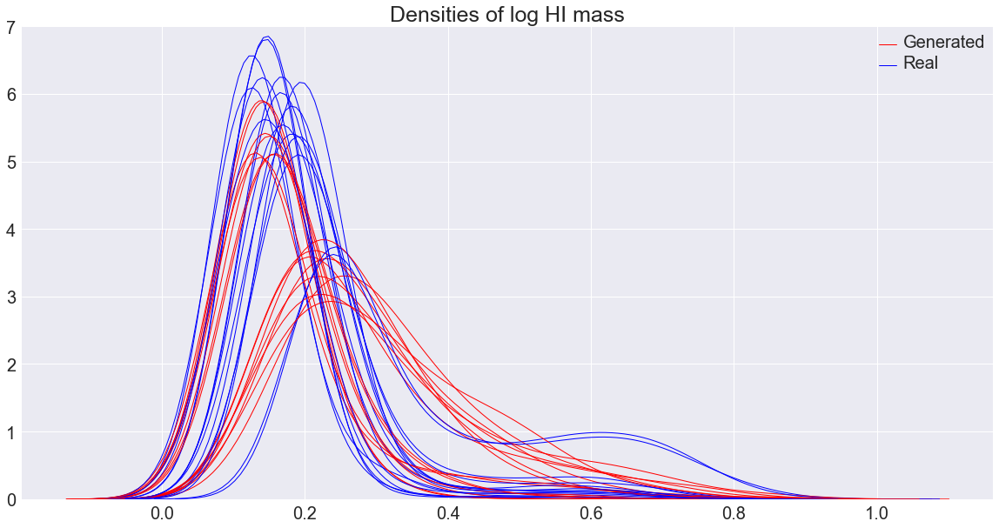

[2/100][790/1000][501] Loss_D: -774.812500 Loss_G: -675904.500000 Loss_D_real: -158749.625000 Loss_D_fake -157974.812500
[2/100][795/1000][502] Loss_D: -727.359375 Loss_G: -677799.750000 Loss_D_real: -192414.421875 Loss_D_fake -191687.062500
[2/100][800/1000][503] Loss_D: -567.781250 Loss_G: -651247.250000 Loss_D_real: -174487.343750 Loss_D_fake -173919.562500
[2/100][805/1000][504] Loss_D: -661.046875 Loss_G: -621606.000000 Loss_D_real: -173857.062500 Loss_D_fake -173196.015625
[2/100][810/1000][505] Loss_D: -745.062500 Loss_G: -628296.312500 Loss_D_real: -225989.281250 Loss_D_fake -225244.218750
[2/100][815/1000][506] Loss_D: -517.562500 Loss_G: -608169.125000 Loss_D_real: -192491.890625 Loss_D_fake -191974.328125
[2/100][820/1000][507] Loss_D: -636.328125 Loss_G: -638611.375000 Loss_D_real: -208376.265625 Loss_D_fake -207739.937500
[2/100][825/1000][508] Loss_D: -625.421875 Loss_G: -591207.500000 Loss_D_real: -224843.500000 Loss_D_fake -224218.078125
[2/100][830/1000][509] Loss_D: -

[3/100][130/1000][569] Loss_D: -652.484375 Loss_G: -600086.250000 Loss_D_real: -203585.015625 Loss_D_fake -202932.531250
[3/100][135/1000][570] Loss_D: -675.656250 Loss_G: -629006.125000 Loss_D_real: -186600.125000 Loss_D_fake -185924.468750
[3/100][140/1000][571] Loss_D: -750.015625 Loss_G: -727862.312500 Loss_D_real: -217590.046875 Loss_D_fake -216840.031250
[3/100][145/1000][572] Loss_D: -620.187500 Loss_G: -529847.875000 Loss_D_real: -184341.671875 Loss_D_fake -183721.484375
[3/100][150/1000][573] Loss_D: -530.578125 Loss_G: -557059.562500 Loss_D_real: -197260.921875 Loss_D_fake -196730.343750
[3/100][155/1000][574] Loss_D: -399.984375 Loss_G: -679792.312500 Loss_D_real: -214361.203125 Loss_D_fake -213961.218750
[3/100][160/1000][575] Loss_D: -494.500000 Loss_G: -750525.750000 Loss_D_real: -166494.468750 Loss_D_fake -165999.968750
[3/100][165/1000][576] Loss_D: -595.640625 Loss_G: -628456.687500 Loss_D_real: -154263.250000 Loss_D_fake -153667.609375
[3/100][170/1000][577] Loss_D: -

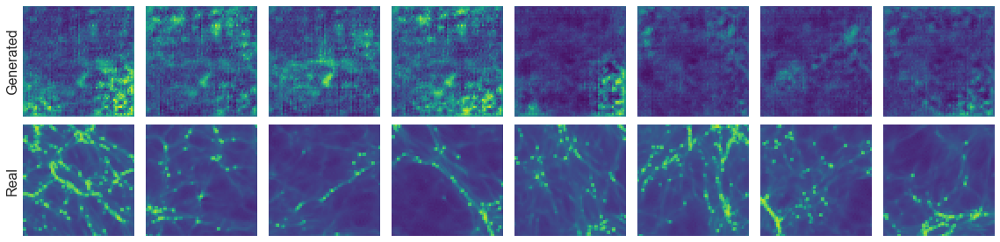

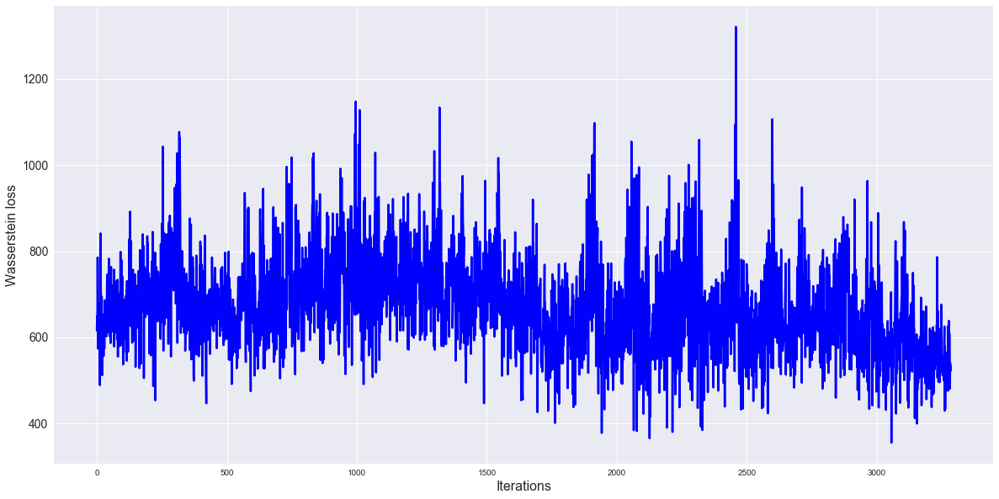

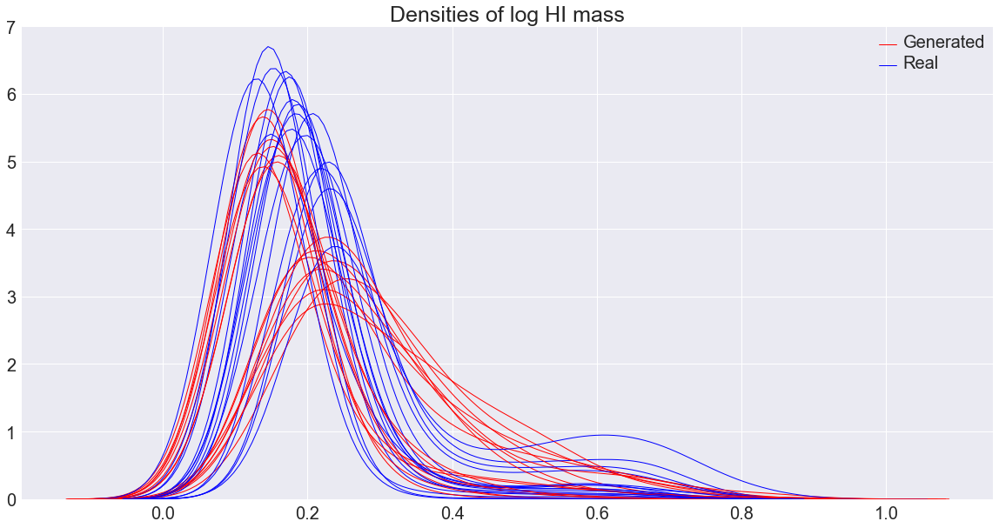

[3/100][290/1000][601] Loss_D: -593.140625 Loss_G: -581752.562500 Loss_D_real: -212343.828125 Loss_D_fake -211750.687500
[3/100][295/1000][602] Loss_D: -567.546875 Loss_G: -666676.562500 Loss_D_real: -162849.093750 Loss_D_fake -162281.546875
[3/100][300/1000][603] Loss_D: -527.828125 Loss_G: -689522.437500 Loss_D_real: -180033.328125 Loss_D_fake -179505.500000
[3/100][305/1000][604] Loss_D: -541.281250 Loss_G: -555488.687500 Loss_D_real: -181949.234375 Loss_D_fake -181407.953125
[3/100][310/1000][605] Loss_D: -500.156250 Loss_G: -577042.562500 Loss_D_real: -186243.578125 Loss_D_fake -185743.421875
[3/100][315/1000][606] Loss_D: -531.187500 Loss_G: -610971.312500 Loss_D_real: -186913.046875 Loss_D_fake -186381.859375
[3/100][320/1000][607] Loss_D: -493.328125 Loss_G: -601679.625000 Loss_D_real: -206729.812500 Loss_D_fake -206236.484375
[3/100][325/1000][608] Loss_D: -461.453125 Loss_G: -589748.750000 Loss_D_real: -225462.156250 Loss_D_fake -225000.703125
[3/100][330/1000][609] Loss_D: -

[3/100][630/1000][669] Loss_D: -748.562500 Loss_G: -500534.437500 Loss_D_real: -247850.062500 Loss_D_fake -247101.500000
[3/100][635/1000][670] Loss_D: -633.031250 Loss_G: -573791.375000 Loss_D_real: -229534.859375 Loss_D_fake -228901.828125
[3/100][640/1000][671] Loss_D: -531.265625 Loss_G: -681603.375000 Loss_D_real: -164886.781250 Loss_D_fake -164355.515625
[3/100][645/1000][672] Loss_D: -714.406250 Loss_G: -751011.812500 Loss_D_real: -196211.468750 Loss_D_fake -195497.062500
[3/100][650/1000][673] Loss_D: -565.890625 Loss_G: -603722.687500 Loss_D_real: -168830.171875 Loss_D_fake -168264.281250
[3/100][655/1000][674] Loss_D: -572.015625 Loss_G: -638079.125000 Loss_D_real: -216929.718750 Loss_D_fake -216357.703125
[3/100][660/1000][675] Loss_D: -706.906250 Loss_G: -761769.187500 Loss_D_real: -235781.109375 Loss_D_fake -235074.203125
[3/100][665/1000][676] Loss_D: -899.109375 Loss_G: -550975.062500 Loss_D_real: -187085.562500 Loss_D_fake -186186.453125
[3/100][670/1000][677] Loss_D: -

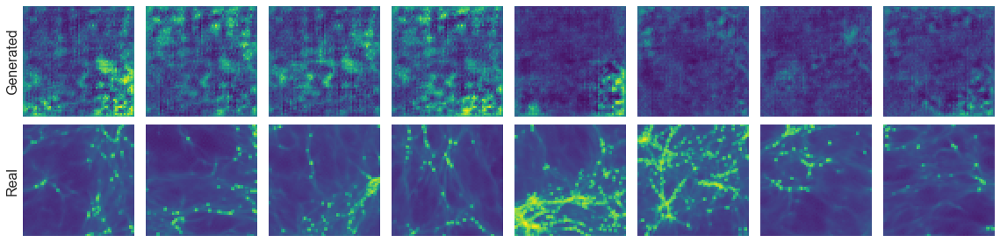

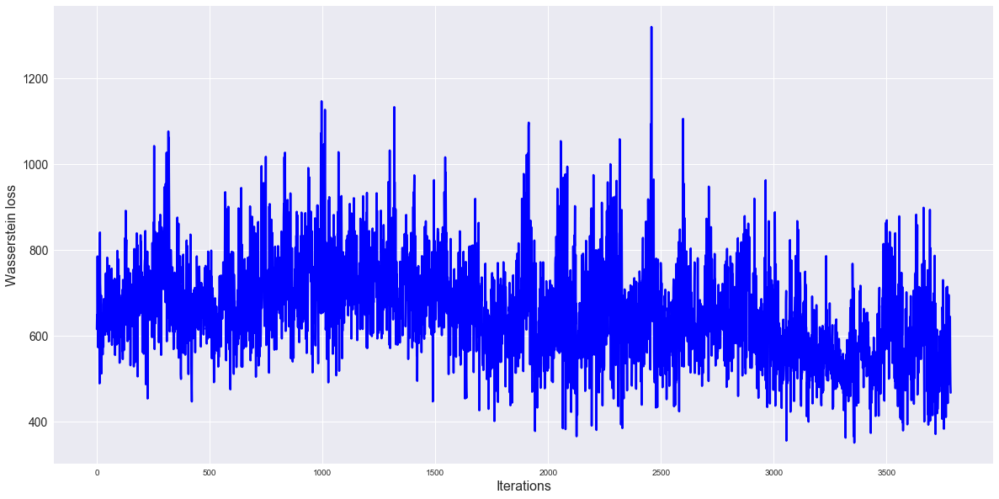

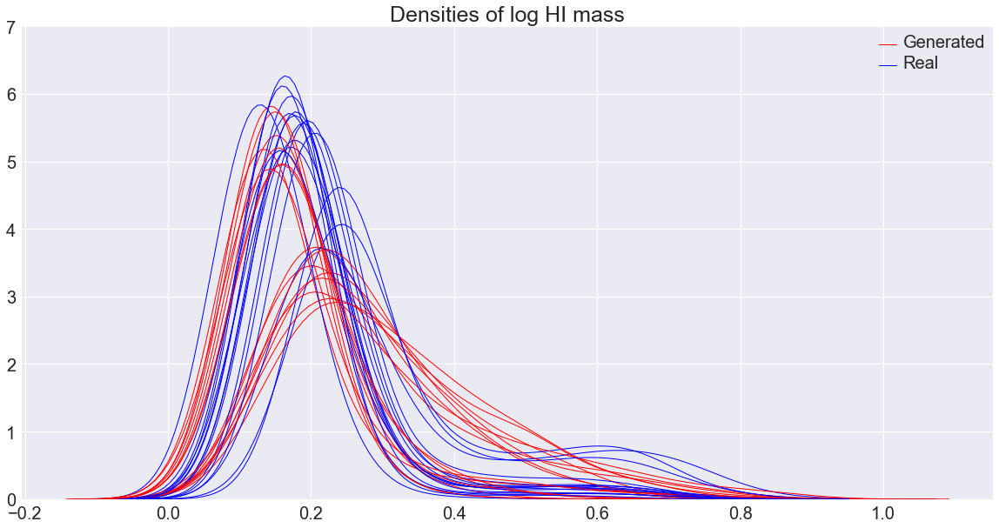

[3/100][790/1000][701] Loss_D: -470.718750 Loss_G: -711316.750000 Loss_D_real: -214005.593750 Loss_D_fake -213534.875000
[3/100][795/1000][702] Loss_D: -492.453125 Loss_G: -669466.062500 Loss_D_real: -162711.625000 Loss_D_fake -162219.171875
[3/100][800/1000][703] Loss_D: -611.750000 Loss_G: -542896.062500 Loss_D_real: -195078.781250 Loss_D_fake -194467.031250
[3/100][805/1000][704] Loss_D: -652.890625 Loss_G: -775121.500000 Loss_D_real: -161431.015625 Loss_D_fake -160778.125000
[3/100][810/1000][705] Loss_D: -580.093750 Loss_G: -636492.375000 Loss_D_real: -194727.578125 Loss_D_fake -194147.484375
[3/100][815/1000][706] Loss_D: -586.359375 Loss_G: -618975.937500 Loss_D_real: -210971.890625 Loss_D_fake -210385.531250
[3/100][820/1000][707] Loss_D: -599.062500 Loss_G: -667097.562500 Loss_D_real: -179402.000000 Loss_D_fake -178802.937500
[3/100][825/1000][708] Loss_D: -533.484375 Loss_G: -712900.937500 Loss_D_real: -163400.203125 Loss_D_fake -162866.718750
[3/100][830/1000][709] Loss_D: -

[4/100][130/1000][769] Loss_D: -718.156250 Loss_G: -725701.250000 Loss_D_real: -239663.453125 Loss_D_fake -238945.296875
[4/100][135/1000][770] Loss_D: -646.921875 Loss_G: -588006.062500 Loss_D_real: -170515.171875 Loss_D_fake -169868.250000
[4/100][140/1000][771] Loss_D: -270.343750 Loss_G: -710228.187500 Loss_D_real: -223027.765625 Loss_D_fake -222757.421875
[4/100][145/1000][772] Loss_D: -565.859375 Loss_G: -702673.125000 Loss_D_real: -219969.953125 Loss_D_fake -219404.093750
[4/100][150/1000][773] Loss_D: -482.125000 Loss_G: -595712.937500 Loss_D_real: -181682.265625 Loss_D_fake -181200.140625
[4/100][155/1000][774] Loss_D: -522.515625 Loss_G: -682105.375000 Loss_D_real: -182327.609375 Loss_D_fake -181805.093750
[4/100][160/1000][775] Loss_D: -520.453125 Loss_G: -640423.687500 Loss_D_real: -162351.656250 Loss_D_fake -161831.203125
[4/100][165/1000][776] Loss_D: -247.562500 Loss_G: -542835.687500 Loss_D_real: -211824.187500 Loss_D_fake -211576.625000
[4/100][170/1000][777] Loss_D: -

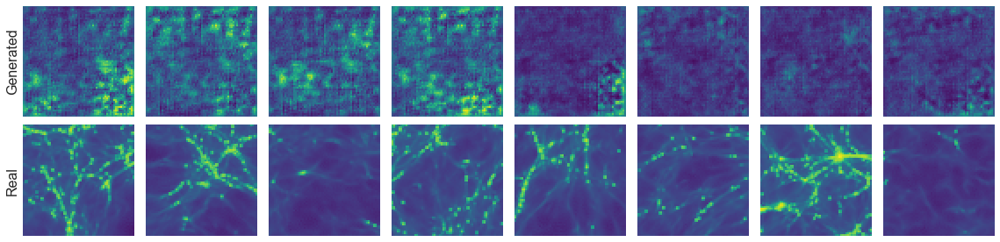

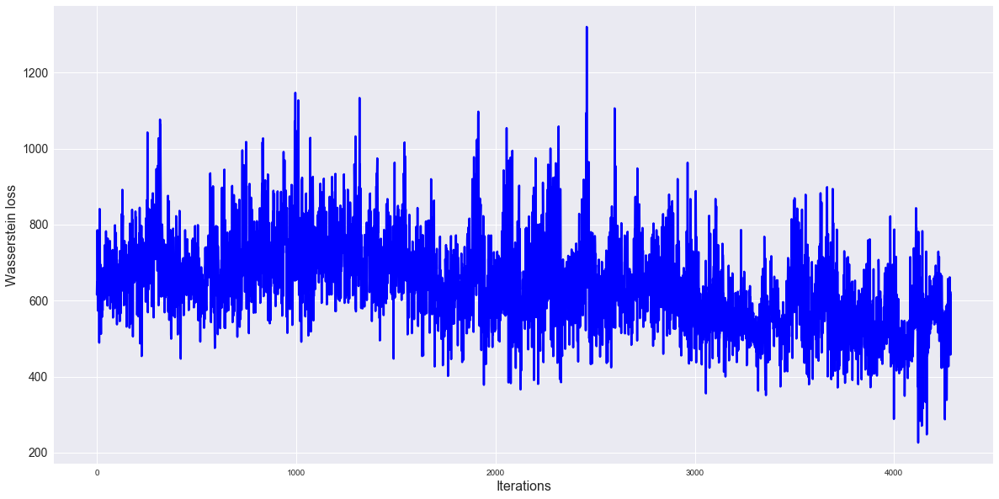

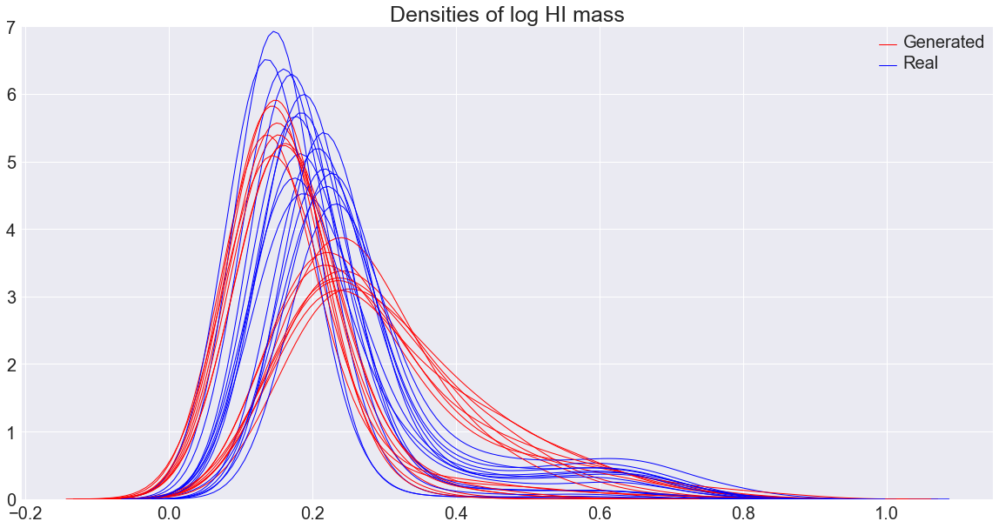

[4/100][385/1000][801] Loss_D: -1240.000000 Loss_G: -763159.562500 Loss_D_real: -265920.812500 Loss_D_fake -264680.812500
[4/100][390/1000][802] Loss_D: -602.125000 Loss_G: -802099.312500 Loss_D_real: -284807.812500 Loss_D_fake -284205.687500
[4/100][395/1000][803] Loss_D: -855.843750 Loss_G: -642663.750000 Loss_D_real: -267911.656250 Loss_D_fake -267055.812500
[4/100][400/1000][804] Loss_D: -592.828125 Loss_G: -747931.625000 Loss_D_real: -247322.203125 Loss_D_fake -246729.375000
[4/100][405/1000][805] Loss_D: -999.000000 Loss_G: -713408.187500 Loss_D_real: -194985.843750 Loss_D_fake -193986.843750
[4/100][410/1000][806] Loss_D: -852.765625 Loss_G: -743835.812500 Loss_D_real: -228615.687500 Loss_D_fake -227762.921875
[4/100][415/1000][807] Loss_D: -1133.093750 Loss_G: -703630.875000 Loss_D_real: -209761.750000 Loss_D_fake -208628.656250
[4/100][420/1000][808] Loss_D: -652.015625 Loss_G: -704855.562500 Loss_D_real: -246780.296875 Loss_D_fake -246128.281250
[4/100][425/1000][809] Loss_D:

[4/100][725/1000][869] Loss_D: -570.390625 Loss_G: -537982.125000 Loss_D_real: -201770.531250 Loss_D_fake -201200.140625
[4/100][730/1000][870] Loss_D: -646.500000 Loss_G: -744123.687500 Loss_D_real: -153233.156250 Loss_D_fake -152586.656250
[4/100][735/1000][871] Loss_D: -537.328125 Loss_G: -531604.812500 Loss_D_real: -184923.718750 Loss_D_fake -184386.390625
[4/100][740/1000][872] Loss_D: -387.453125 Loss_G: -624749.437500 Loss_D_real: -217005.203125 Loss_D_fake -216617.750000
[4/100][745/1000][873] Loss_D: -524.859375 Loss_G: -542385.000000 Loss_D_real: -183064.000000 Loss_D_fake -182539.140625
[4/100][750/1000][874] Loss_D: -455.359375 Loss_G: -530161.312500 Loss_D_real: -217971.453125 Loss_D_fake -217516.093750
[4/100][755/1000][875] Loss_D: -507.578125 Loss_G: -624670.125000 Loss_D_real: -189069.812500 Loss_D_fake -188562.234375
[4/100][760/1000][876] Loss_D: -536.906250 Loss_G: -567882.312500 Loss_D_real: -177379.328125 Loss_D_fake -176842.421875
[4/100][765/1000][877] Loss_D: -

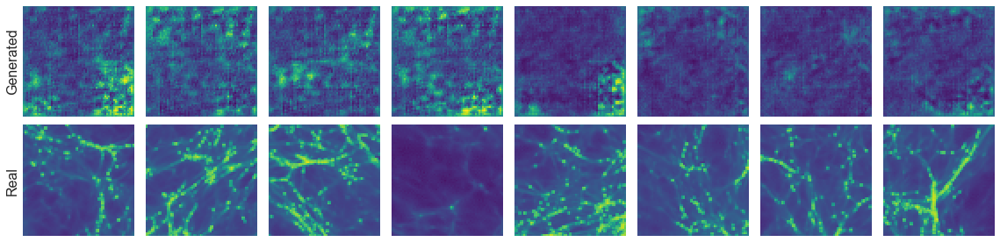

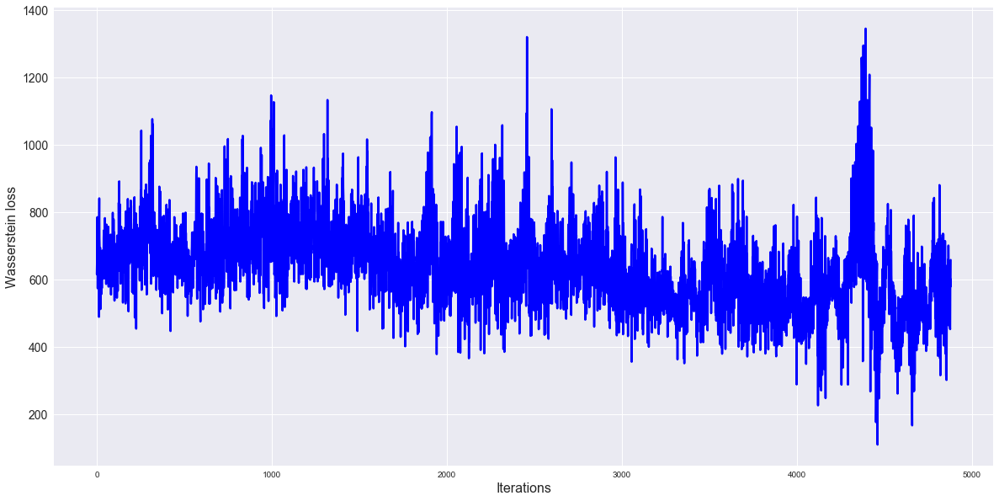

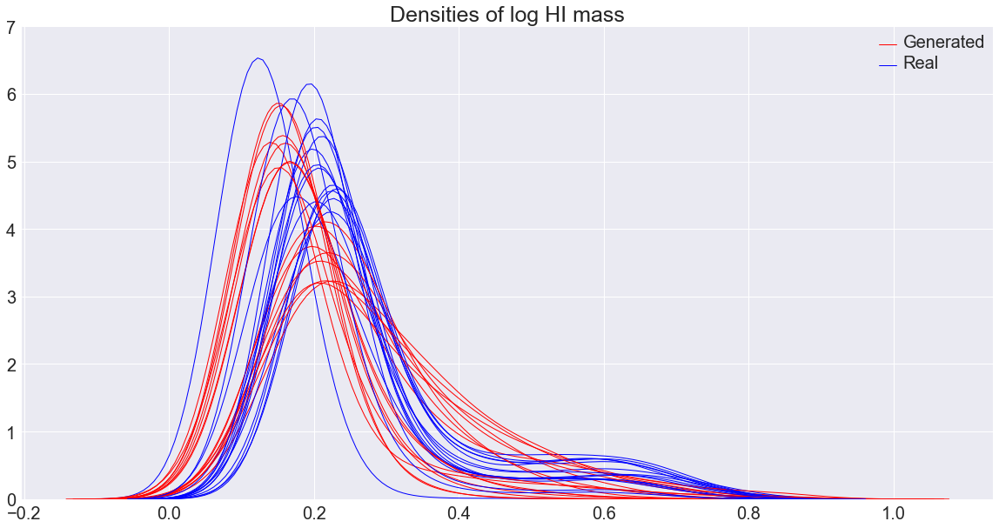

[4/100][885/1000][901] Loss_D: -638.984375 Loss_G: -658440.000000 Loss_D_real: -186362.796875 Loss_D_fake -185723.812500
[4/100][890/1000][902] Loss_D: -597.968750 Loss_G: -607323.187500 Loss_D_real: -171534.625000 Loss_D_fake -170936.656250
[4/100][895/1000][903] Loss_D: -636.968750 Loss_G: -705762.625000 Loss_D_real: -222126.187500 Loss_D_fake -221489.218750
[4/100][900/1000][904] Loss_D: -552.734375 Loss_G: -784094.500000 Loss_D_real: -177969.375000 Loss_D_fake -177416.640625
[4/100][905/1000][905] Loss_D: -606.156250 Loss_G: -673749.375000 Loss_D_real: -225661.109375 Loss_D_fake -225054.953125
[4/100][910/1000][906] Loss_D: -541.031250 Loss_G: -692480.812500 Loss_D_real: -196337.687500 Loss_D_fake -195796.656250
[4/100][915/1000][907] Loss_D: -522.656250 Loss_G: -536405.375000 Loss_D_real: -149257.546875 Loss_D_fake -148734.890625
[4/100][920/1000][908] Loss_D: -716.546875 Loss_G: -712340.750000 Loss_D_real: -213619.390625 Loss_D_fake -212902.843750
[4/100][925/1000][909] Loss_D: -

[5/100][225/1000][969] Loss_D: -467.859375 Loss_G: -626506.812500 Loss_D_real: -195616.593750 Loss_D_fake -195148.734375
[5/100][230/1000][970] Loss_D: -482.312500 Loss_G: -731207.937500 Loss_D_real: -180383.000000 Loss_D_fake -179900.687500
[5/100][235/1000][971] Loss_D: -472.781250 Loss_G: -654941.000000 Loss_D_real: -165462.984375 Loss_D_fake -164990.203125
[5/100][240/1000][972] Loss_D: -518.531250 Loss_G: -513977.875000 Loss_D_real: -194275.750000 Loss_D_fake -193757.218750
[5/100][245/1000][973] Loss_D: -502.890625 Loss_G: -637733.187500 Loss_D_real: -193523.281250 Loss_D_fake -193020.390625
[5/100][250/1000][974] Loss_D: -524.578125 Loss_G: -574982.375000 Loss_D_real: -178030.140625 Loss_D_fake -177505.562500
[5/100][255/1000][975] Loss_D: -442.656250 Loss_G: -716612.375000 Loss_D_real: -225370.906250 Loss_D_fake -224928.250000
[5/100][260/1000][976] Loss_D: -508.406250 Loss_G: -658855.625000 Loss_D_real: -194001.843750 Loss_D_fake -193493.437500
[5/100][265/1000][977] Loss_D: -

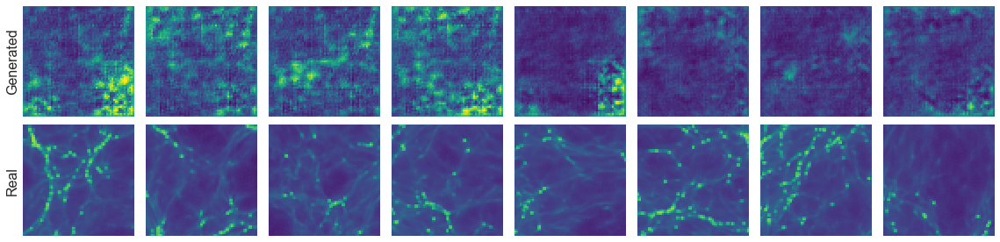

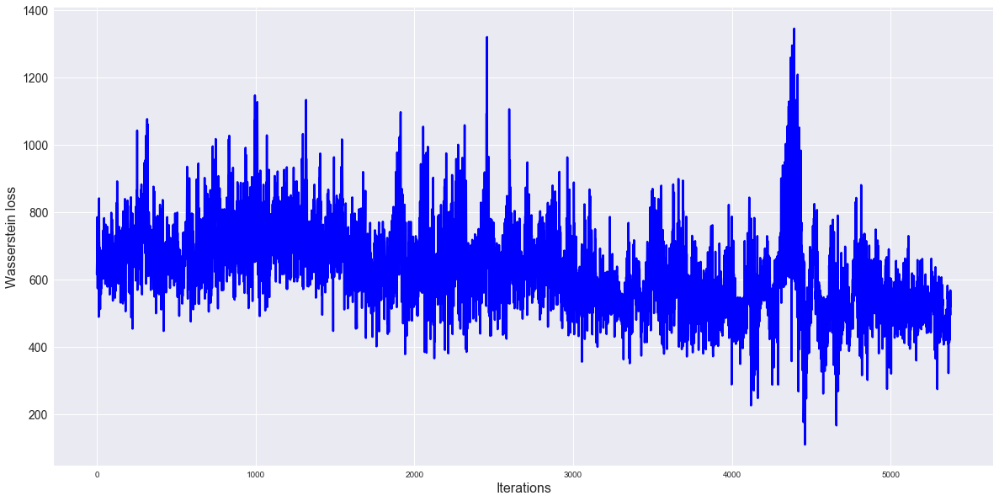

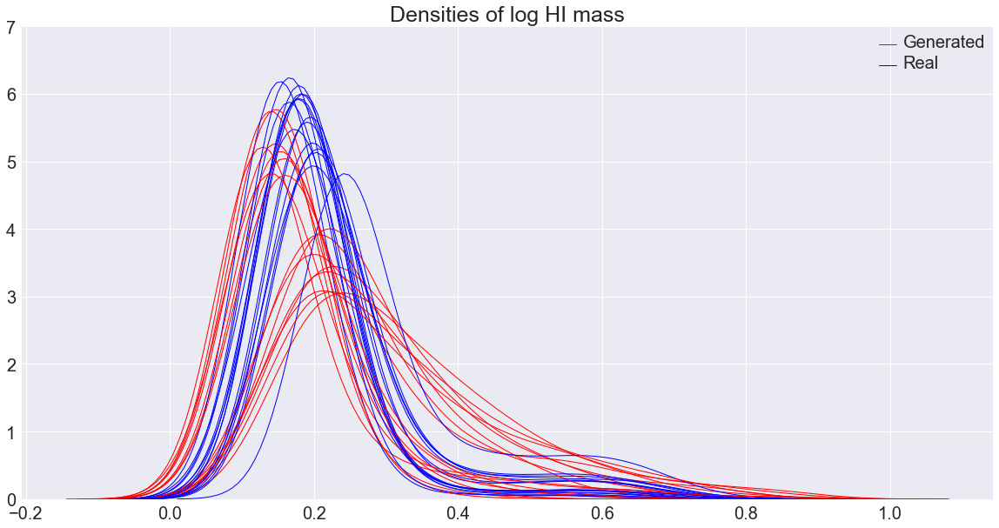

[5/100][385/1000][1001] Loss_D: -569.015625 Loss_G: -537531.250000 Loss_D_real: -165514.406250 Loss_D_fake -164945.390625
[5/100][390/1000][1002] Loss_D: -548.468750 Loss_G: -612792.937500 Loss_D_real: -181624.000000 Loss_D_fake -181075.531250
[5/100][395/1000][1003] Loss_D: -609.296875 Loss_G: -532254.937500 Loss_D_real: -181057.921875 Loss_D_fake -180448.625000
[5/100][400/1000][1004] Loss_D: -474.125000 Loss_G: -719944.187500 Loss_D_real: -229368.250000 Loss_D_fake -228894.125000
[5/100][405/1000][1005] Loss_D: -496.406250 Loss_G: -613530.375000 Loss_D_real: -166273.781250 Loss_D_fake -165777.375000
[5/100][410/1000][1006] Loss_D: -497.546875 Loss_G: -690514.750000 Loss_D_real: -151448.015625 Loss_D_fake -150950.468750
[5/100][415/1000][1007] Loss_D: -495.734375 Loss_G: -632870.937500 Loss_D_real: -182345.546875 Loss_D_fake -181849.812500
[5/100][420/1000][1008] Loss_D: -503.718750 Loss_G: -607775.062500 Loss_D_real: -169796.093750 Loss_D_fake -169292.375000
[5/100][425/1000][1009] 

[5/100][725/1000][1069] Loss_D: -477.250000 Loss_G: -529480.812500 Loss_D_real: -192331.781250 Loss_D_fake -191854.531250
[5/100][730/1000][1070] Loss_D: -561.265625 Loss_G: -536020.437500 Loss_D_real: -162014.437500 Loss_D_fake -161453.171875
[5/100][735/1000][1071] Loss_D: -776.750000 Loss_G: -619480.375000 Loss_D_real: -178268.578125 Loss_D_fake -177491.828125
[5/100][740/1000][1072] Loss_D: -628.140625 Loss_G: -636466.750000 Loss_D_real: -161799.171875 Loss_D_fake -161171.031250
[5/100][745/1000][1073] Loss_D: -623.890625 Loss_G: -587405.312500 Loss_D_real: -176654.796875 Loss_D_fake -176030.906250
[5/100][750/1000][1074] Loss_D: -603.796875 Loss_G: -637512.250000 Loss_D_real: -144813.500000 Loss_D_fake -144209.703125
[5/100][755/1000][1075] Loss_D: -445.218750 Loss_G: -707751.625000 Loss_D_real: -163131.515625 Loss_D_fake -162686.296875
[5/100][760/1000][1076] Loss_D: -740.406250 Loss_G: -658034.562500 Loss_D_real: -194926.687500 Loss_D_fake -194186.281250
[5/100][765/1000][1077] 

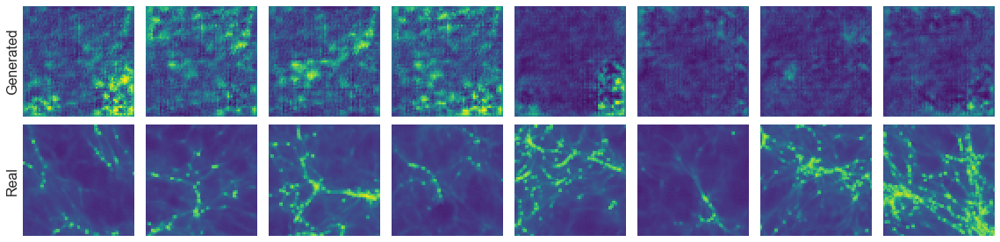

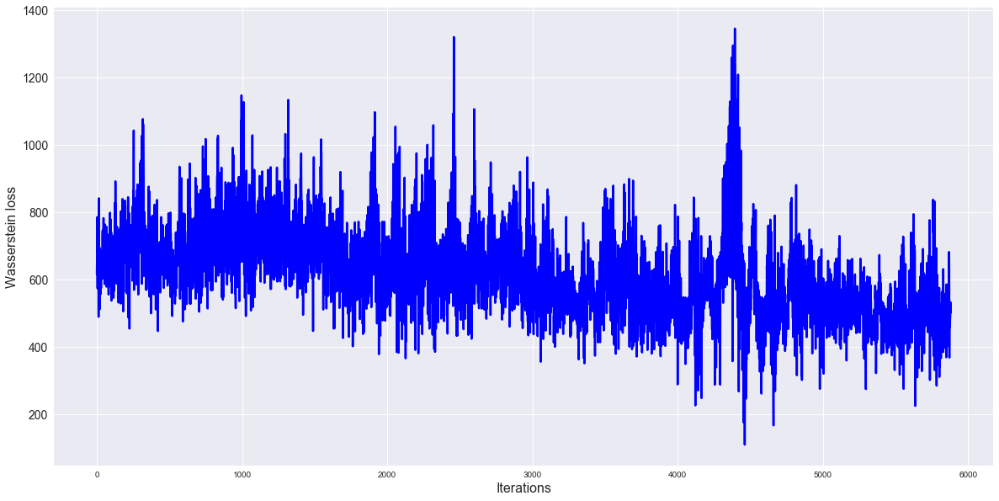

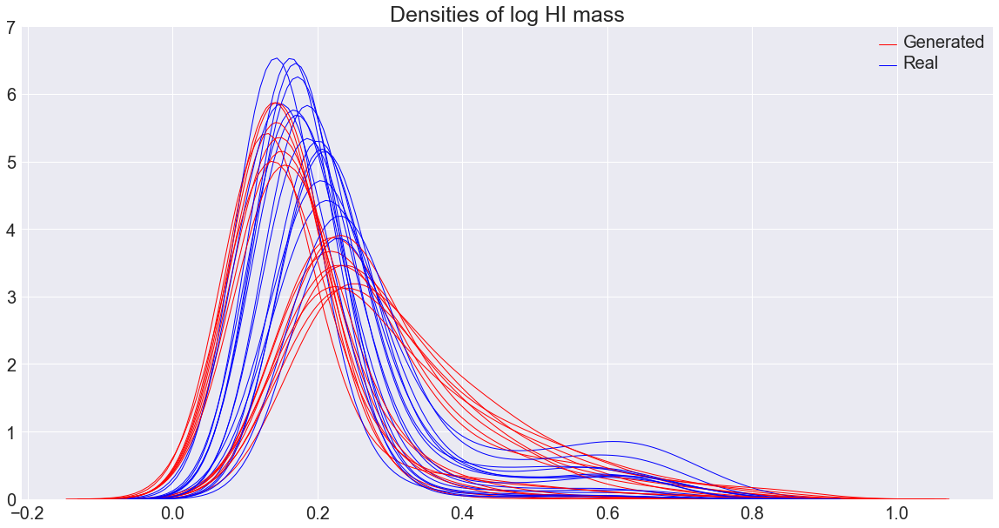

[5/100][885/1000][1101] Loss_D: -523.968750 Loss_G: -590545.375000 Loss_D_real: -173990.812500 Loss_D_fake -173466.843750
[5/100][890/1000][1102] Loss_D: -477.859375 Loss_G: -621587.375000 Loss_D_real: -173232.500000 Loss_D_fake -172754.640625
[5/100][895/1000][1103] Loss_D: -597.187500 Loss_G: -527103.937500 Loss_D_real: -188136.156250 Loss_D_fake -187538.968750
[5/100][900/1000][1104] Loss_D: -471.203125 Loss_G: -645043.437500 Loss_D_real: -189499.812500 Loss_D_fake -189028.609375
[5/100][905/1000][1105] Loss_D: -739.156250 Loss_G: -644847.875000 Loss_D_real: -170049.062500 Loss_D_fake -169309.906250
[5/100][910/1000][1106] Loss_D: -408.062500 Loss_G: -590880.875000 Loss_D_real: -153312.953125 Loss_D_fake -152904.890625
[5/100][915/1000][1107] Loss_D: -514.078125 Loss_G: -623485.000000 Loss_D_real: -169792.468750 Loss_D_fake -169278.390625
[5/100][920/1000][1108] Loss_D: -474.031250 Loss_G: -748022.187500 Loss_D_real: -233087.859375 Loss_D_fake -232613.828125
[5/100][925/1000][1109] 

[6/100][225/1000][1169] Loss_D: -470.937500 Loss_G: -562443.437500 Loss_D_real: -244305.781250 Loss_D_fake -243834.843750
[6/100][230/1000][1170] Loss_D: -503.031250 Loss_G: -612137.062500 Loss_D_real: -229041.703125 Loss_D_fake -228538.671875
[6/100][235/1000][1171] Loss_D: -404.031250 Loss_G: -661466.875000 Loss_D_real: -228665.843750 Loss_D_fake -228261.812500
[6/100][240/1000][1172] Loss_D: -436.703125 Loss_G: -688483.375000 Loss_D_real: -208922.156250 Loss_D_fake -208485.453125
[6/100][245/1000][1173] Loss_D: -532.640625 Loss_G: -673784.875000 Loss_D_real: -175831.078125 Loss_D_fake -175298.437500
[6/100][250/1000][1174] Loss_D: -564.968750 Loss_G: -613783.375000 Loss_D_real: -257577.734375 Loss_D_fake -257012.765625
[6/100][255/1000][1175] Loss_D: -474.390625 Loss_G: -585762.250000 Loss_D_real: -196362.046875 Loss_D_fake -195887.656250
[6/100][260/1000][1176] Loss_D: -627.625000 Loss_G: -658935.375000 Loss_D_real: -245532.531250 Loss_D_fake -244904.906250
[6/100][265/1000][1177] 

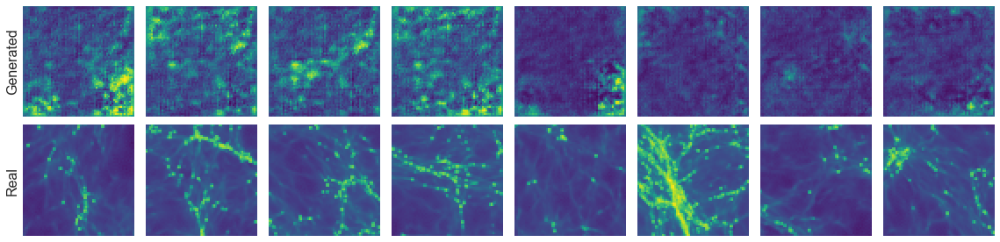

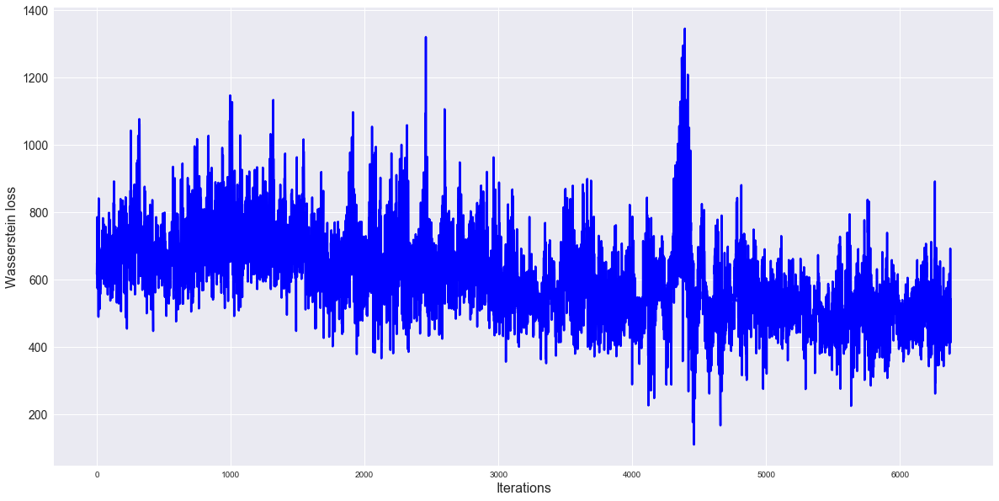

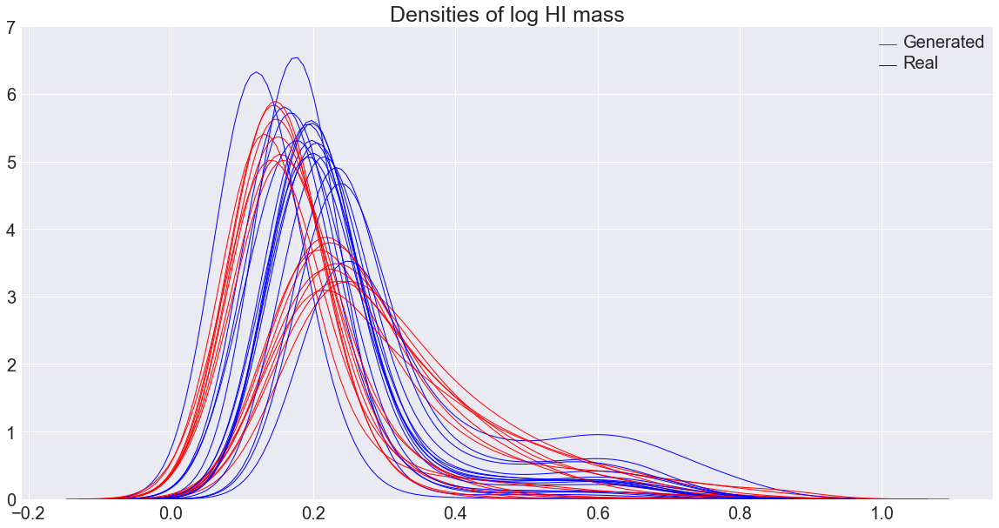

[6/100][480/1000][1201] Loss_D: -521.531250 Loss_G: -636262.125000 Loss_D_real: -165918.281250 Loss_D_fake -165396.750000
[6/100][485/1000][1202] Loss_D: -491.515625 Loss_G: -705531.500000 Loss_D_real: -151526.390625 Loss_D_fake -151034.875000
[6/100][490/1000][1203] Loss_D: -523.875000 Loss_G: -705605.250000 Loss_D_real: -199805.406250 Loss_D_fake -199281.531250
[6/100][495/1000][1204] Loss_D: -634.531250 Loss_G: -639951.875000 Loss_D_real: -181866.984375 Loss_D_fake -181232.453125
[6/100][500/1000][1205] Loss_D: -571.671875 Loss_G: -591074.187500 Loss_D_real: -181942.234375 Loss_D_fake -181370.562500
[6/100][505/1000][1206] Loss_D: -660.437500 Loss_G: -877597.625000 Loss_D_real: -198808.203125 Loss_D_fake -198147.765625
[6/100][510/1000][1207] Loss_D: -826.859375 Loss_G: -657716.250000 Loss_D_real: -195393.156250 Loss_D_fake -194566.296875
[6/100][515/1000][1208] Loss_D: -440.671875 Loss_G: -606114.937500 Loss_D_real: -143709.171875 Loss_D_fake -143268.500000
[6/100][520/1000][1209] 

[6/100][820/1000][1269] Loss_D: -528.437500 Loss_G: -635187.437500 Loss_D_real: -210620.156250 Loss_D_fake -210091.718750
[6/100][825/1000][1270] Loss_D: -341.546875 Loss_G: -548256.062500 Loss_D_real: -191060.796875 Loss_D_fake -190719.250000
[6/100][830/1000][1271] Loss_D: -762.265625 Loss_G: -649604.562500 Loss_D_real: -175522.343750 Loss_D_fake -174760.078125
[6/100][835/1000][1272] Loss_D: -414.250000 Loss_G: -662400.500000 Loss_D_real: -207398.593750 Loss_D_fake -206984.343750
[6/100][840/1000][1273] Loss_D: -487.000000 Loss_G: -623010.000000 Loss_D_real: -155615.031250 Loss_D_fake -155128.031250
[6/100][845/1000][1274] Loss_D: -355.156250 Loss_G: -616562.625000 Loss_D_real: -217715.109375 Loss_D_fake -217359.953125
[6/100][850/1000][1275] Loss_D: -517.125000 Loss_G: -726874.062500 Loss_D_real: -202168.937500 Loss_D_fake -201651.812500
[6/100][855/1000][1276] Loss_D: -417.171875 Loss_G: -564087.312500 Loss_D_real: -185038.531250 Loss_D_fake -184621.359375
[6/100][860/1000][1277] 

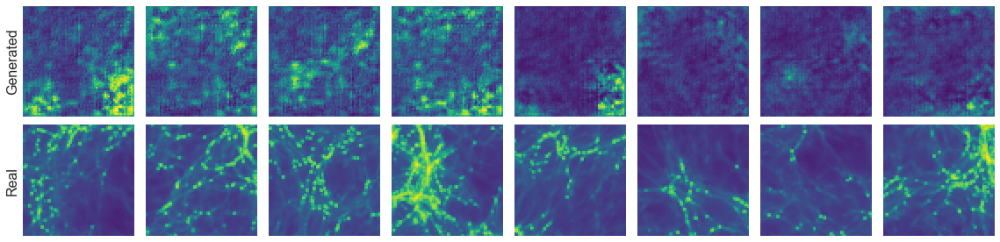

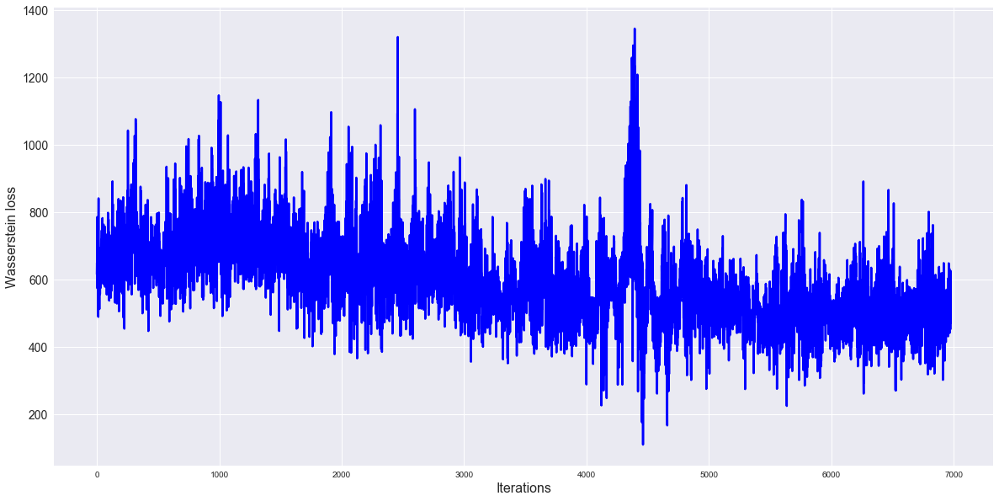

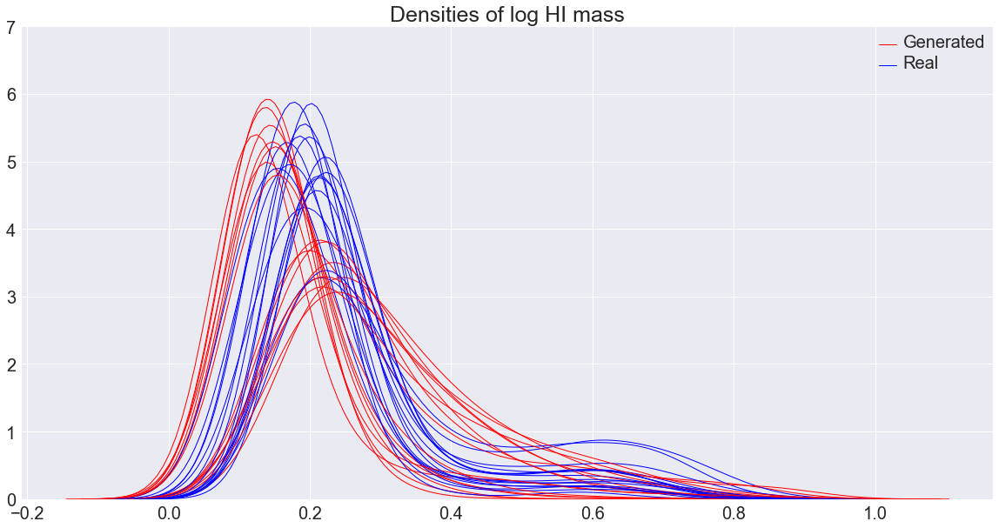

[6/100][980/1000][1301] Loss_D: -516.156250 Loss_G: -549707.937500 Loss_D_real: -179647.703125 Loss_D_fake -179131.546875
[6/100][985/1000][1302] Loss_D: -545.093750 Loss_G: -642345.562500 Loss_D_real: -147849.015625 Loss_D_fake -147303.921875
[6/100][990/1000][1303] Loss_D: -471.859375 Loss_G: -618147.750000 Loss_D_real: -150295.171875 Loss_D_fake -149823.312500
[6/100][995/1000][1304] Loss_D: -512.750000 Loss_G: -570798.750000 Loss_D_real: -211432.218750 Loss_D_fake -210919.468750
[6/100][1000/1000][1305] Loss_D: -498.625000 Loss_G: -676665.187500 Loss_D_real: -200580.953125 Loss_D_fake -200082.328125
[7/100][5/1000][1306] Loss_D: -513.593750 Loss_G: -585368.125000 Loss_D_real: -217048.250000 Loss_D_fake -216534.656250
[7/100][10/1000][1307] Loss_D: -504.359375 Loss_G: -610765.062500 Loss_D_real: -183675.140625 Loss_D_fake -183170.781250
[7/100][15/1000][1308] Loss_D: -429.796875 Loss_G: -615307.187500 Loss_D_real: -169830.015625 Loss_D_fake -169400.218750
[7/100][20/1000][1309] Loss

[7/100][320/1000][1369] Loss_D: -570.000000 Loss_G: -661770.812500 Loss_D_real: -181916.625000 Loss_D_fake -181346.625000
[7/100][325/1000][1370] Loss_D: -633.421875 Loss_G: -657862.500000 Loss_D_real: -162871.031250 Loss_D_fake -162237.609375
[7/100][330/1000][1371] Loss_D: -643.390625 Loss_G: -733943.062500 Loss_D_real: -214750.890625 Loss_D_fake -214107.500000
[7/100][335/1000][1372] Loss_D: -618.875000 Loss_G: -698512.812500 Loss_D_real: -228891.453125 Loss_D_fake -228272.578125
[7/100][340/1000][1373] Loss_D: -343.031250 Loss_G: -694476.187500 Loss_D_real: -210243.765625 Loss_D_fake -209900.734375
[7/100][345/1000][1374] Loss_D: -528.046875 Loss_G: -540717.500000 Loss_D_real: -191240.218750 Loss_D_fake -190712.171875
[7/100][350/1000][1375] Loss_D: -703.218750 Loss_G: -705655.437500 Loss_D_real: -157890.546875 Loss_D_fake -157187.328125
[7/100][355/1000][1376] Loss_D: -462.343750 Loss_G: -571003.875000 Loss_D_real: -142246.906250 Loss_D_fake -141784.562500
[7/100][360/1000][1377] 

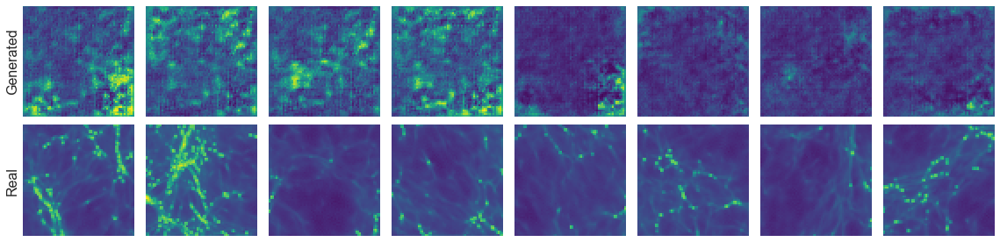

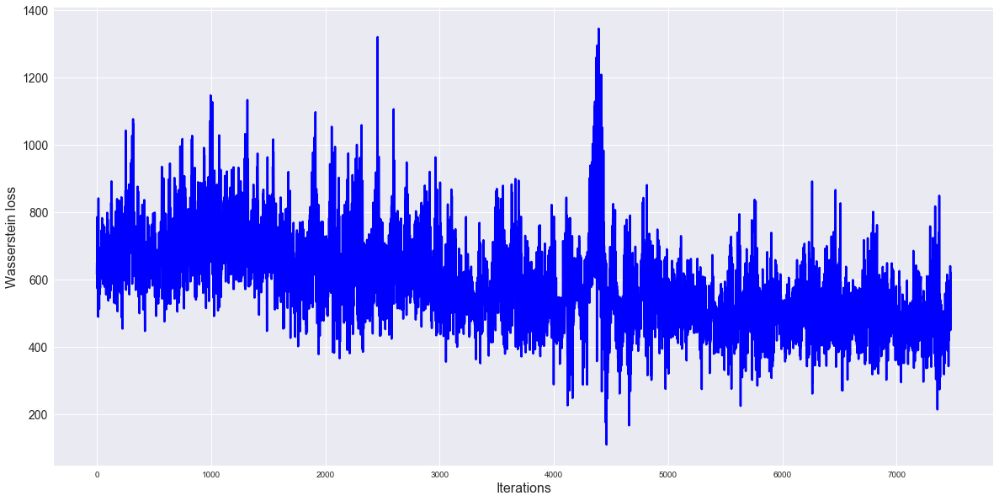

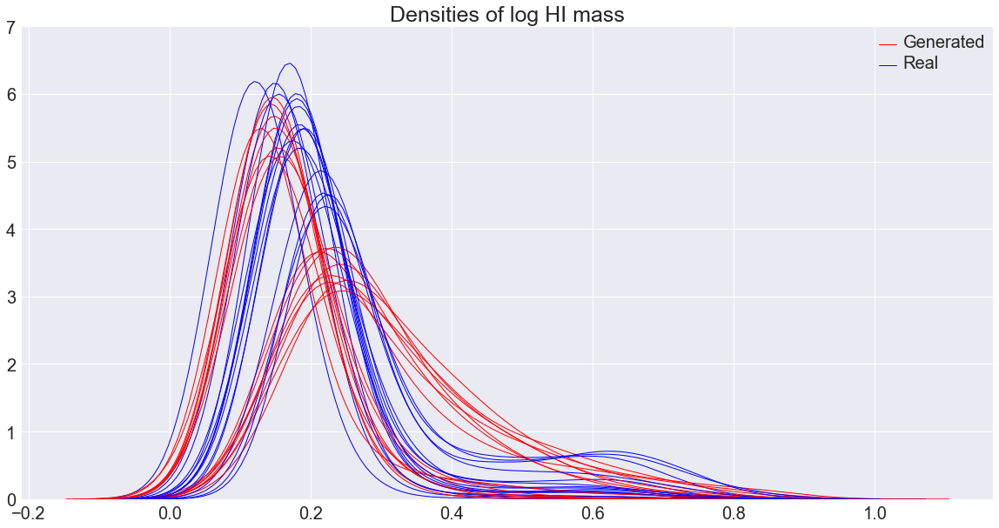

[7/100][480/1000][1401] Loss_D: -661.234375 Loss_G: -594224.250000 Loss_D_real: -197819.718750 Loss_D_fake -197158.484375
[7/100][485/1000][1402] Loss_D: -570.218750 Loss_G: -724494.625000 Loss_D_real: -261449.875000 Loss_D_fake -260879.656250
[7/100][490/1000][1403] Loss_D: -472.734375 Loss_G: -656926.812500 Loss_D_real: -179009.750000 Loss_D_fake -178537.015625
[7/100][495/1000][1404] Loss_D: -572.593750 Loss_G: -632255.625000 Loss_D_real: -231905.421875 Loss_D_fake -231332.828125
[7/100][500/1000][1405] Loss_D: -368.968750 Loss_G: -706692.062500 Loss_D_real: -234754.296875 Loss_D_fake -234385.328125
[7/100][505/1000][1406] Loss_D: -706.578125 Loss_G: -569104.437500 Loss_D_real: -199270.921875 Loss_D_fake -198564.343750
[7/100][510/1000][1407] Loss_D: -653.718750 Loss_G: -636294.375000 Loss_D_real: -197303.781250 Loss_D_fake -196650.062500
[7/100][515/1000][1408] Loss_D: -452.031250 Loss_G: -734774.625000 Loss_D_real: -230227.718750 Loss_D_fake -229775.687500
[7/100][520/1000][1409] 

[7/100][820/1000][1469] Loss_D: -455.343750 Loss_G: -529359.187500 Loss_D_real: -151651.984375 Loss_D_fake -151196.640625
[7/100][825/1000][1470] Loss_D: -496.531250 Loss_G: -726080.875000 Loss_D_real: -185057.531250 Loss_D_fake -184561.000000
[7/100][830/1000][1471] Loss_D: -515.000000 Loss_G: -568129.250000 Loss_D_real: -152407.343750 Loss_D_fake -151892.343750
[7/100][835/1000][1472] Loss_D: -485.203125 Loss_G: -606995.437500 Loss_D_real: -203407.562500 Loss_D_fake -202922.359375
[7/100][840/1000][1473] Loss_D: -417.046875 Loss_G: -688767.000000 Loss_D_real: -186962.343750 Loss_D_fake -186545.296875
[7/100][845/1000][1474] Loss_D: -474.593750 Loss_G: -645432.875000 Loss_D_real: -220998.953125 Loss_D_fake -220524.359375
[7/100][850/1000][1475] Loss_D: -479.500000 Loss_G: -826872.562500 Loss_D_real: -173057.828125 Loss_D_fake -172578.328125
[7/100][855/1000][1476] Loss_D: -402.812500 Loss_G: -676910.125000 Loss_D_real: -140289.859375 Loss_D_fake -139887.046875
[7/100][860/1000][1477] 

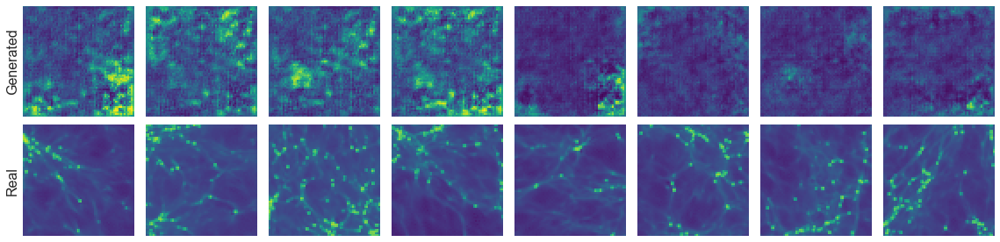

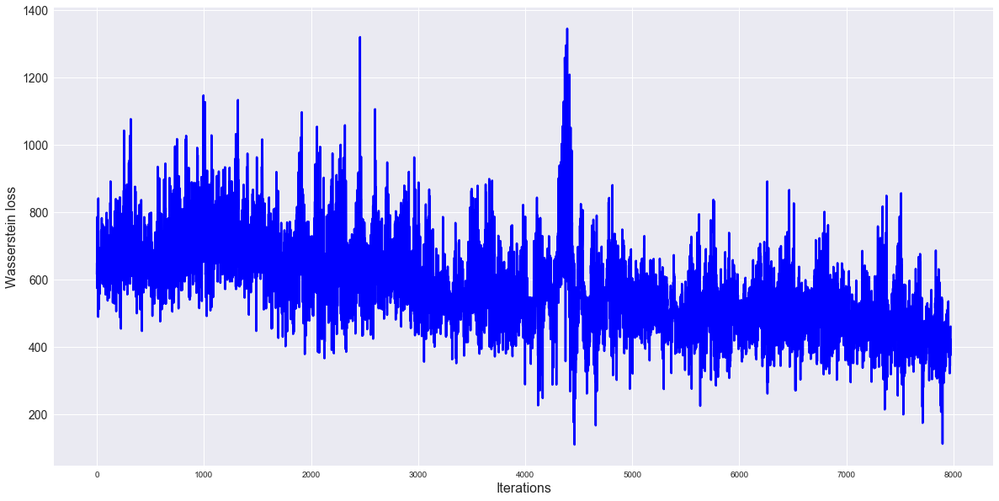

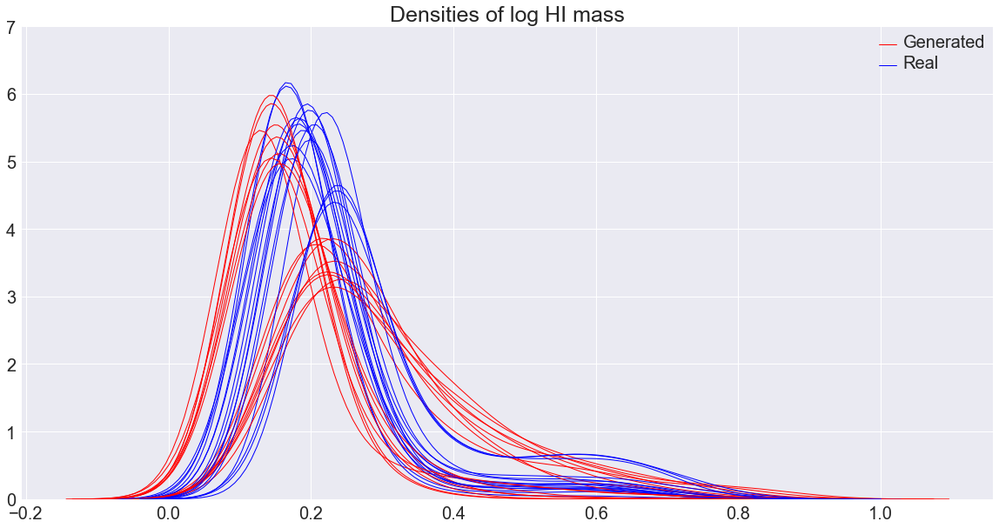

[7/100][980/1000][1501] Loss_D: -522.718750 Loss_G: -743002.000000 Loss_D_real: -237580.000000 Loss_D_fake -237057.281250
[7/100][985/1000][1502] Loss_D: -472.203125 Loss_G: -678453.937500 Loss_D_real: -173451.421875 Loss_D_fake -172979.218750
[7/100][990/1000][1503] Loss_D: -390.015625 Loss_G: -609247.937500 Loss_D_real: -171393.328125 Loss_D_fake -171003.312500
[7/100][995/1000][1504] Loss_D: -385.375000 Loss_G: -737780.875000 Loss_D_real: -172873.656250 Loss_D_fake -172488.281250
[7/100][1000/1000][1505] Loss_D: -590.968750 Loss_G: -629317.625000 Loss_D_real: -190367.515625 Loss_D_fake -189776.546875
[8/100][5/1000][1506] Loss_D: -524.453125 Loss_G: -656333.375000 Loss_D_real: -156578.265625 Loss_D_fake -156053.812500
[8/100][10/1000][1507] Loss_D: -432.968750 Loss_G: -616547.375000 Loss_D_real: -201505.281250 Loss_D_fake -201072.312500
[8/100][15/1000][1508] Loss_D: -340.000000 Loss_G: -568305.000000 Loss_D_real: -217610.046875 Loss_D_fake -217270.046875
[8/100][20/1000][1509] Loss

[8/100][320/1000][1569] Loss_D: -418.640625 Loss_G: -653790.500000 Loss_D_real: -176208.312500 Loss_D_fake -175789.671875
[8/100][325/1000][1570] Loss_D: -492.609375 Loss_G: -623036.375000 Loss_D_real: -226783.500000 Loss_D_fake -226290.890625
[8/100][330/1000][1571] Loss_D: -375.078125 Loss_G: -723811.187500 Loss_D_real: -179671.796875 Loss_D_fake -179296.718750
[8/100][335/1000][1572] Loss_D: -594.531250 Loss_G: -619638.187500 Loss_D_real: -161418.968750 Loss_D_fake -160824.437500
[8/100][340/1000][1573] Loss_D: -550.703125 Loss_G: -654346.500000 Loss_D_real: -259865.671875 Loss_D_fake -259314.968750
[8/100][345/1000][1574] Loss_D: -689.031250 Loss_G: -556763.250000 Loss_D_real: -161719.296875 Loss_D_fake -161030.265625
[8/100][350/1000][1575] Loss_D: -497.531250 Loss_G: -653942.750000 Loss_D_real: -193899.875000 Loss_D_fake -193402.343750
[8/100][355/1000][1576] Loss_D: -528.484375 Loss_G: -680666.312500 Loss_D_real: -223848.187500 Loss_D_fake -223319.703125
[8/100][360/1000][1577] 

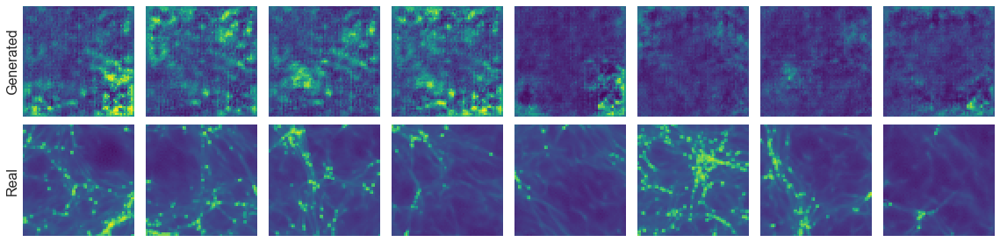

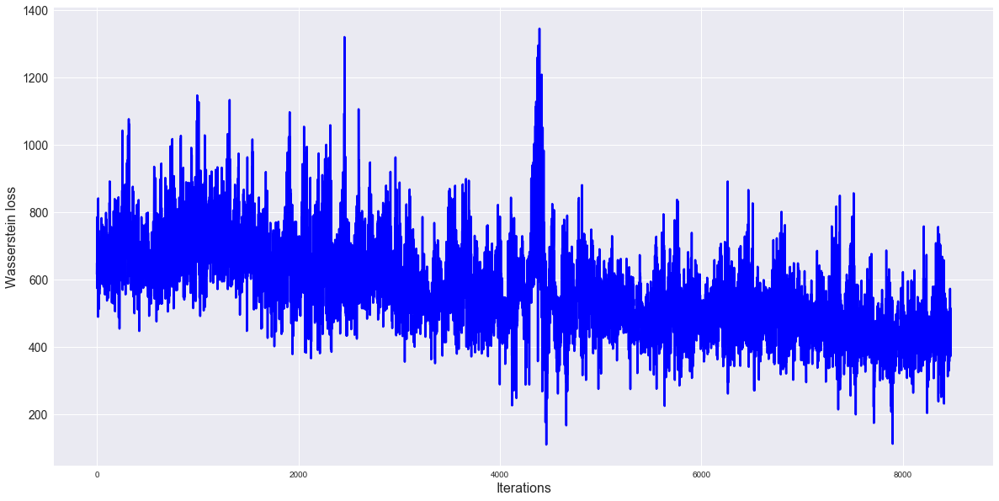

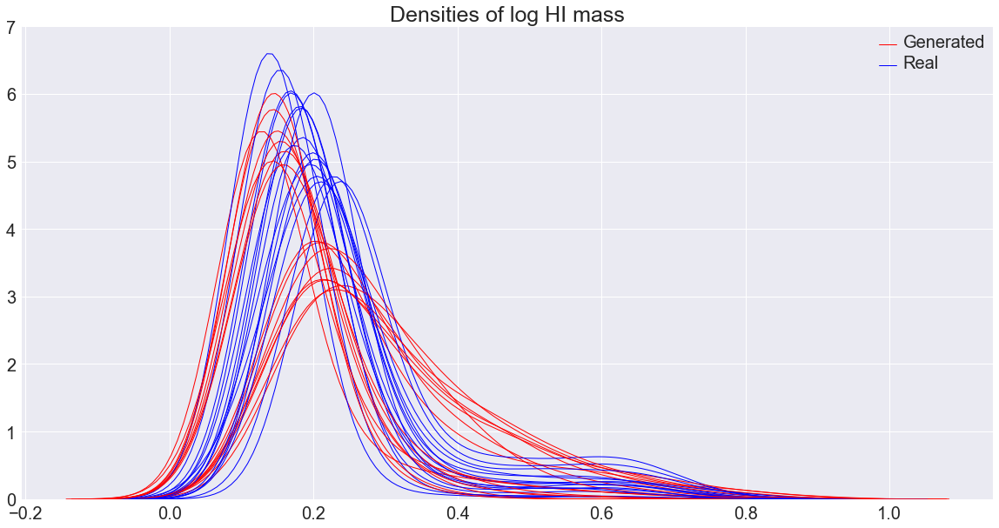

[8/100][575/1000][1601] Loss_D: -593.484375 Loss_G: -575924.875000 Loss_D_real: -196688.890625 Loss_D_fake -196095.406250
[8/100][580/1000][1602] Loss_D: -485.859375 Loss_G: -683173.687500 Loss_D_real: -181127.640625 Loss_D_fake -180641.781250
[8/100][585/1000][1603] Loss_D: -540.515625 Loss_G: -625269.937500 Loss_D_real: -244774.859375 Loss_D_fake -244234.343750
[8/100][590/1000][1604] Loss_D: -432.906250 Loss_G: -623092.562500 Loss_D_real: -227307.531250 Loss_D_fake -226874.625000
[8/100][595/1000][1605] Loss_D: -388.140625 Loss_G: -673178.375000 Loss_D_real: -163868.718750 Loss_D_fake -163480.578125
[8/100][600/1000][1606] Loss_D: -394.578125 Loss_G: -647954.437500 Loss_D_real: -196777.609375 Loss_D_fake -196383.031250
[8/100][605/1000][1607] Loss_D: -385.250000 Loss_G: -619275.687500 Loss_D_real: -197974.718750 Loss_D_fake -197589.468750
[8/100][610/1000][1608] Loss_D: -433.265625 Loss_G: -670096.625000 Loss_D_real: -165102.218750 Loss_D_fake -164668.953125
[8/100][615/1000][1609] 

[8/100][915/1000][1669] Loss_D: -496.890625 Loss_G: -606385.312500 Loss_D_real: -177913.406250 Loss_D_fake -177416.515625
[8/100][920/1000][1670] Loss_D: -320.796875 Loss_G: -736471.375000 Loss_D_real: -179653.703125 Loss_D_fake -179332.906250
[8/100][925/1000][1671] Loss_D: -428.031250 Loss_G: -704344.437500 Loss_D_real: -178328.765625 Loss_D_fake -177900.734375
[8/100][930/1000][1672] Loss_D: -426.781250 Loss_G: -639782.375000 Loss_D_real: -193531.515625 Loss_D_fake -193104.734375
[8/100][935/1000][1673] Loss_D: -530.031250 Loss_G: -707430.375000 Loss_D_real: -195641.750000 Loss_D_fake -195111.718750
[8/100][940/1000][1674] Loss_D: -399.375000 Loss_G: -656562.437500 Loss_D_real: -163660.312500 Loss_D_fake -163260.937500
[8/100][945/1000][1675] Loss_D: -387.125000 Loss_G: -673656.125000 Loss_D_real: -194663.687500 Loss_D_fake -194276.562500
[8/100][950/1000][1676] Loss_D: -496.609375 Loss_G: -530204.875000 Loss_D_real: -241243.890625 Loss_D_fake -240747.281250
[8/100][955/1000][1677] 

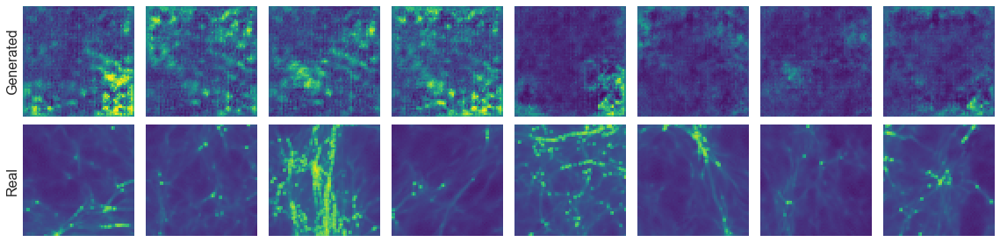

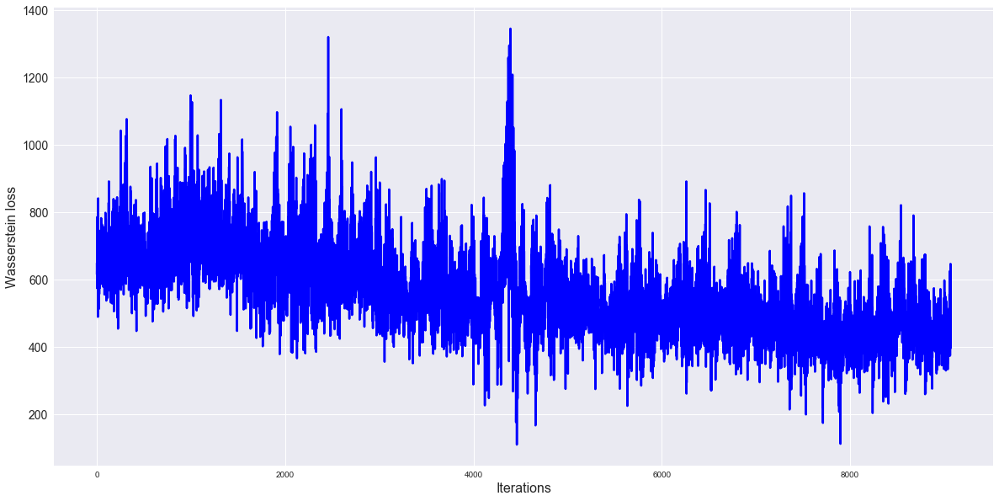

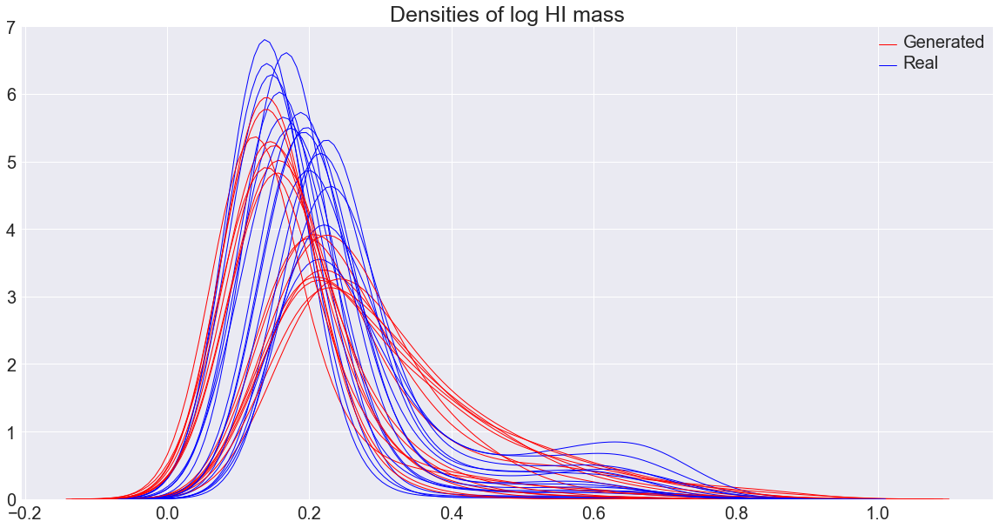

[9/100][75/1000][1701] Loss_D: -430.796875 Loss_G: -778076.937500 Loss_D_real: -194734.625000 Loss_D_fake -194303.828125
[9/100][80/1000][1702] Loss_D: -408.093750 Loss_G: -770799.437500 Loss_D_real: -207548.250000 Loss_D_fake -207140.156250
[9/100][85/1000][1703] Loss_D: -436.359375 Loss_G: -694745.812500 Loss_D_real: -161545.218750 Loss_D_fake -161108.859375
[9/100][90/1000][1704] Loss_D: -479.453125 Loss_G: -567373.375000 Loss_D_real: -242875.125000 Loss_D_fake -242395.671875
[9/100][95/1000][1705] Loss_D: -558.093750 Loss_G: -726415.500000 Loss_D_real: -164007.500000 Loss_D_fake -163449.406250
[9/100][100/1000][1706] Loss_D: -405.468750 Loss_G: -591050.187500 Loss_D_real: -179086.078125 Loss_D_fake -178680.609375
[9/100][105/1000][1707] Loss_D: -456.921875 Loss_G: -616215.937500 Loss_D_real: -224175.609375 Loss_D_fake -223718.687500
[9/100][110/1000][1708] Loss_D: -568.687500 Loss_G: -662630.625000 Loss_D_real: -179684.406250 Loss_D_fake -179115.718750
[9/100][115/1000][1709] Loss_

[9/100][415/1000][1769] Loss_D: -466.781250 Loss_G: -629864.562500 Loss_D_real: -230972.843750 Loss_D_fake -230506.062500
[9/100][420/1000][1770] Loss_D: -457.281250 Loss_G: -791404.125000 Loss_D_real: -231570.421875 Loss_D_fake -231113.140625
[9/100][425/1000][1771] Loss_D: -411.328125 Loss_G: -676975.062500 Loss_D_real: -247009.828125 Loss_D_fake -246598.500000
[9/100][430/1000][1772] Loss_D: -473.359375 Loss_G: -619024.812500 Loss_D_real: -170783.328125 Loss_D_fake -170309.968750
[9/100][435/1000][1773] Loss_D: -478.468750 Loss_G: -773006.187500 Loss_D_real: -231308.828125 Loss_D_fake -230830.359375
[9/100][440/1000][1774] Loss_D: -415.656250 Loss_G: -619103.812500 Loss_D_real: -203172.656250 Loss_D_fake -202757.000000
[9/100][445/1000][1775] Loss_D: -470.031250 Loss_G: -677119.187500 Loss_D_real: -183347.203125 Loss_D_fake -182877.171875
[9/100][450/1000][1776] Loss_D: -443.390625 Loss_G: -744334.812500 Loss_D_real: -184355.718750 Loss_D_fake -183912.328125
[9/100][455/1000][1777] 

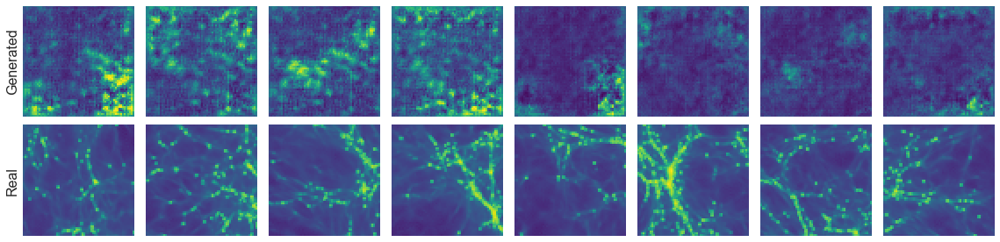

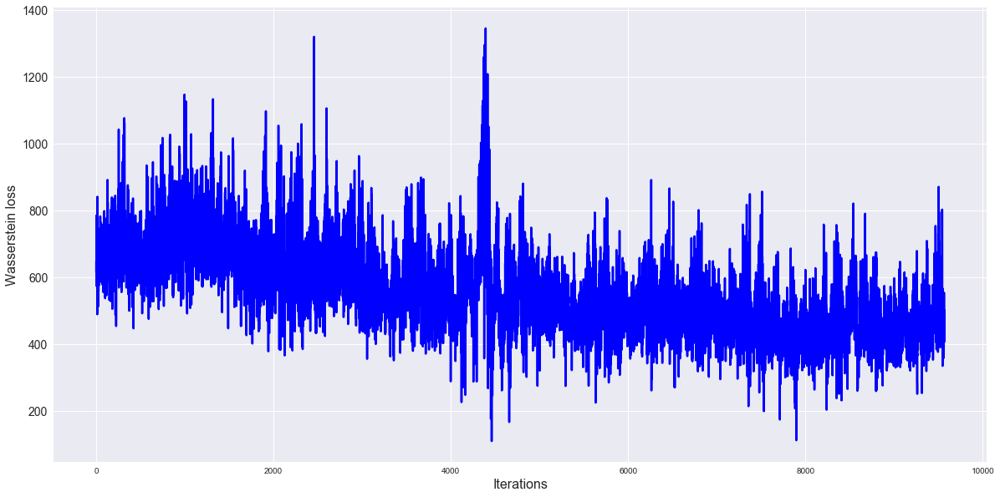

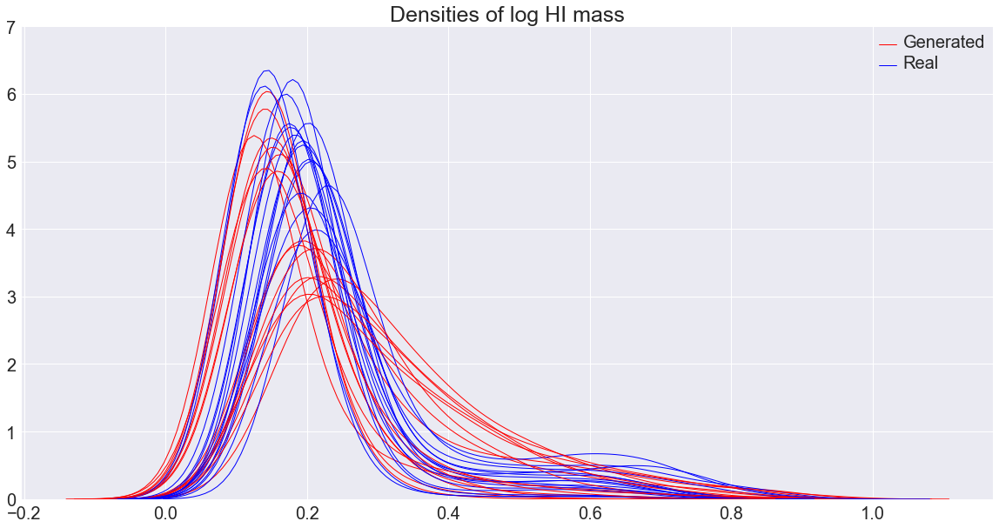

[9/100][575/1000][1801] Loss_D: -452.125000 Loss_G: -745374.562500 Loss_D_real: -203950.781250 Loss_D_fake -203498.656250
[9/100][580/1000][1802] Loss_D: -517.234375 Loss_G: -765983.125000 Loss_D_real: -156763.234375 Loss_D_fake -156246.000000
[9/100][585/1000][1803] Loss_D: -472.687500 Loss_G: -622081.812500 Loss_D_real: -240721.875000 Loss_D_fake -240249.187500
[9/100][590/1000][1804] Loss_D: -346.562500 Loss_G: -683201.750000 Loss_D_real: -208506.203125 Loss_D_fake -208159.640625
[9/100][595/1000][1805] Loss_D: -484.421875 Loss_G: -601504.750000 Loss_D_real: -208932.359375 Loss_D_fake -208447.937500
[9/100][600/1000][1806] Loss_D: -510.453125 Loss_G: -710090.812500 Loss_D_real: -206830.234375 Loss_D_fake -206319.781250
[9/100][605/1000][1807] Loss_D: -566.703125 Loss_G: -723957.000000 Loss_D_real: -223142.906250 Loss_D_fake -222576.203125
[9/100][610/1000][1808] Loss_D: -507.765625 Loss_G: -817426.875000 Loss_D_real: -222019.015625 Loss_D_fake -221511.250000
[9/100][615/1000][1809] 

[9/100][915/1000][1869] Loss_D: -634.421875 Loss_G: -673655.750000 Loss_D_real: -238823.640625 Loss_D_fake -238189.218750
[9/100][920/1000][1870] Loss_D: -574.406250 Loss_G: -657085.375000 Loss_D_real: -222021.250000 Loss_D_fake -221446.843750
[9/100][925/1000][1871] Loss_D: -778.921875 Loss_G: -580012.812500 Loss_D_real: -242688.640625 Loss_D_fake -241909.718750
[9/100][930/1000][1872] Loss_D: -683.062500 Loss_G: -675781.125000 Loss_D_real: -207674.187500 Loss_D_fake -206991.125000
[9/100][935/1000][1873] Loss_D: -420.343750 Loss_G: -706805.500000 Loss_D_real: -255900.687500 Loss_D_fake -255480.343750
[9/100][940/1000][1874] Loss_D: -772.109375 Loss_G: -740291.625000 Loss_D_real: -173205.265625 Loss_D_fake -172433.156250
[9/100][945/1000][1875] Loss_D: -408.218750 Loss_G: -673183.000000 Loss_D_real: -223458.328125 Loss_D_fake -223050.109375
[9/100][950/1000][1876] Loss_D: -454.937500 Loss_G: -772106.125000 Loss_D_real: -206452.781250 Loss_D_fake -205997.843750
[9/100][955/1000][1877] 

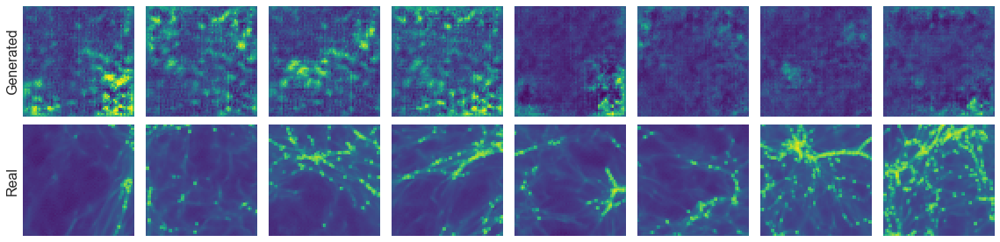

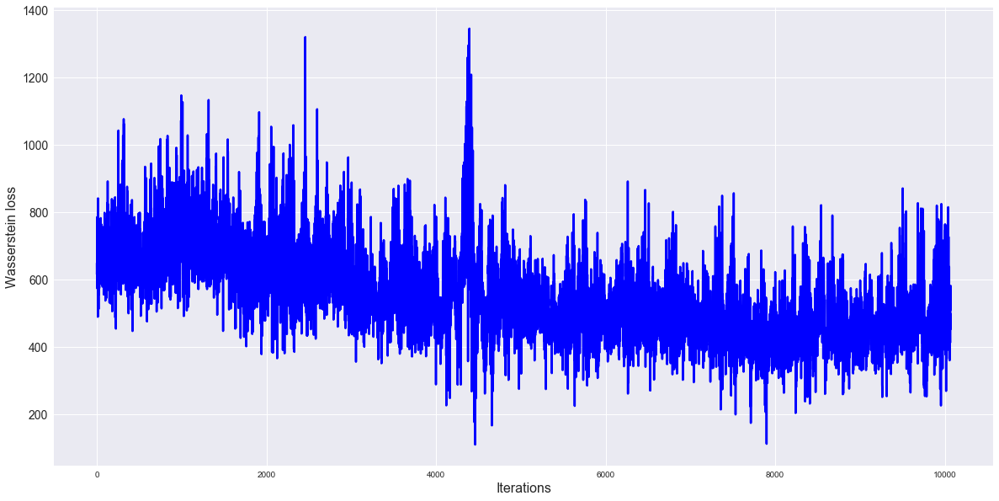

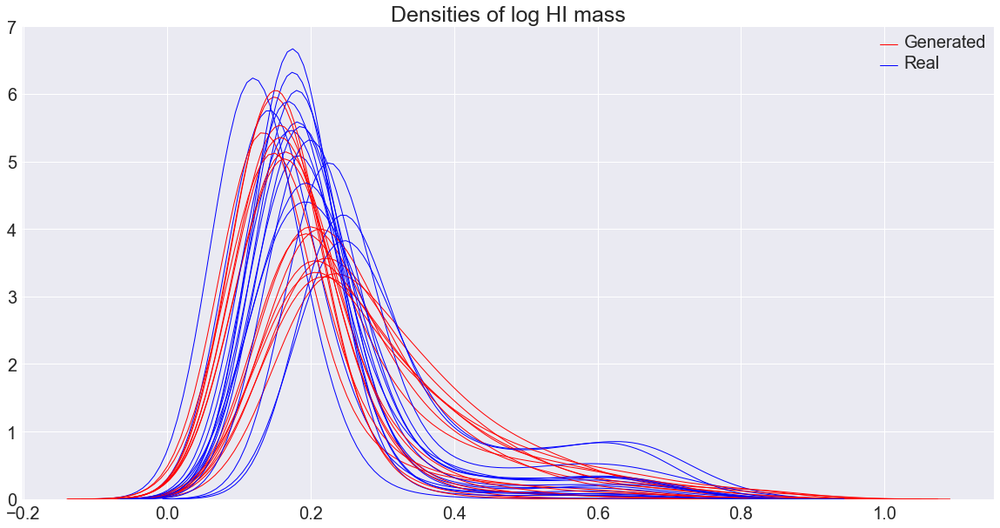

[10/100][75/1000][1901] Loss_D: -645.765625 Loss_G: -555557.000000 Loss_D_real: -238923.859375 Loss_D_fake -238278.093750
[10/100][80/1000][1902] Loss_D: -458.359375 Loss_G: -638769.125000 Loss_D_real: -238751.078125 Loss_D_fake -238292.718750
[10/100][85/1000][1903] Loss_D: -454.343750 Loss_G: -739618.625000 Loss_D_real: -188887.468750 Loss_D_fake -188433.125000
[10/100][90/1000][1904] Loss_D: -439.671875 Loss_G: -772880.062500 Loss_D_real: -222350.156250 Loss_D_fake -221910.484375
[10/100][95/1000][1905] Loss_D: -350.062500 Loss_G: -639861.500000 Loss_D_real: -205869.953125 Loss_D_fake -205519.890625
[10/100][100/1000][1906] Loss_D: -525.906250 Loss_G: -673399.000000 Loss_D_real: -172689.140625 Loss_D_fake -172163.234375
[10/100][105/1000][1907] Loss_D: -647.468750 Loss_G: -656047.875000 Loss_D_real: -205979.593750 Loss_D_fake -205332.125000
[10/100][110/1000][1908] Loss_D: -468.437500 Loss_G: -656315.250000 Loss_D_real: -206034.468750 Loss_D_fake -205566.031250
[10/100][115/1000][19

[10/100][410/1000][1968] Loss_D: -537.250000 Loss_G: -737568.937500 Loss_D_real: -204961.390625 Loss_D_fake -204424.140625
[10/100][415/1000][1969] Loss_D: -591.609375 Loss_G: -570751.562500 Loss_D_real: -221639.968750 Loss_D_fake -221048.359375
[10/100][420/1000][1970] Loss_D: -471.937500 Loss_G: -654040.312500 Loss_D_real: -221497.109375 Loss_D_fake -221025.171875
[10/100][425/1000][1971] Loss_D: -477.671875 Loss_G: -704568.687500 Loss_D_real: -221754.609375 Loss_D_fake -221276.937500
[10/100][430/1000][1972] Loss_D: -787.609375 Loss_G: -605181.937500 Loss_D_real: -188875.484375 Loss_D_fake -188087.875000
[10/100][435/1000][1973] Loss_D: -537.765625 Loss_G: -672839.000000 Loss_D_real: -205667.937500 Loss_D_fake -205130.171875
[10/100][440/1000][1974] Loss_D: -532.296875 Loss_G: -572598.250000 Loss_D_real: -172303.406250 Loss_D_fake -171771.109375
[10/100][445/1000][1975] Loss_D: -388.593750 Loss_G: -689094.187500 Loss_D_real: -172005.906250 Loss_D_fake -171617.312500
[10/100][450/100

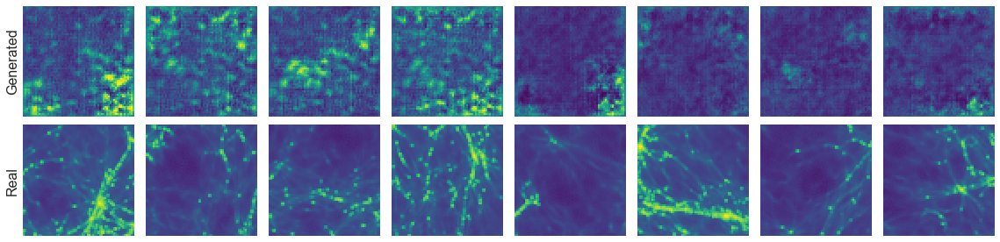

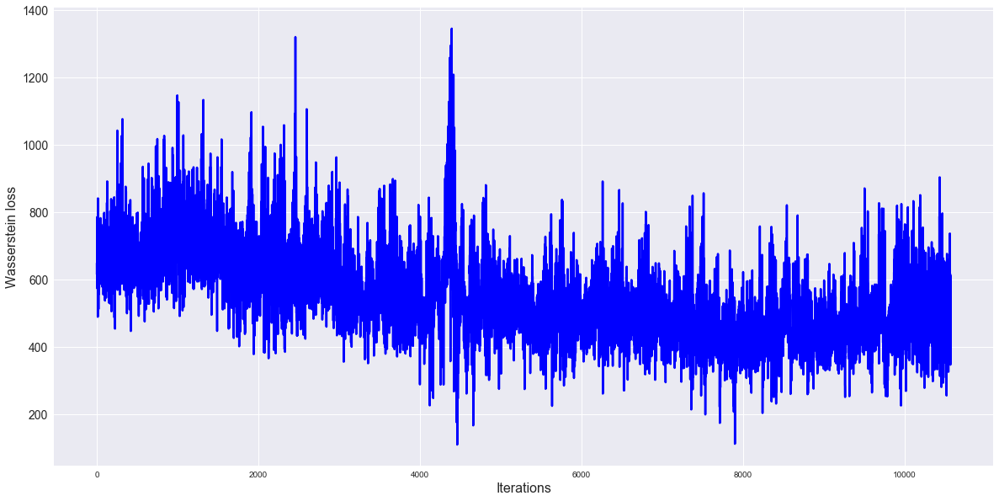

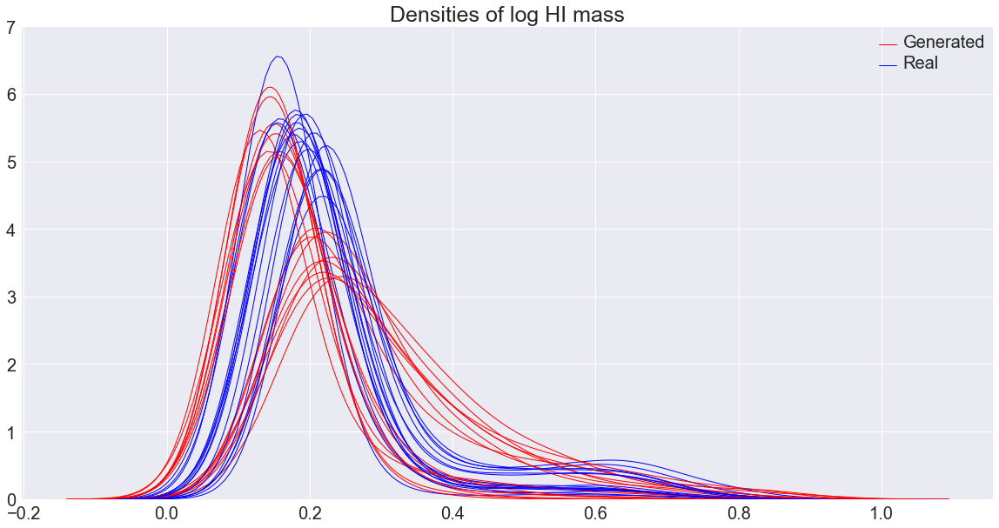

[10/100][670/1000][2001] Loss_D: -552.859375 Loss_G: -625234.875000 Loss_D_real: -256389.515625 Loss_D_fake -255836.656250
[10/100][675/1000][2002] Loss_D: -662.250000 Loss_G: -692028.375000 Loss_D_real: -222607.281250 Loss_D_fake -221945.031250
[10/100][680/1000][2003] Loss_D: -670.265625 Loss_G: -742558.875000 Loss_D_real: -239541.546875 Loss_D_fake -238871.281250
[10/100][685/1000][2004] Loss_D: -580.328125 Loss_G: -658220.562500 Loss_D_real: -205786.562500 Loss_D_fake -205206.234375
[10/100][690/1000][2005] Loss_D: -473.859375 Loss_G: -658038.062500 Loss_D_real: -222339.859375 Loss_D_fake -221866.000000
[10/100][695/1000][2006] Loss_D: -667.750000 Loss_G: -657492.812500 Loss_D_real: -239025.796875 Loss_D_fake -238358.046875
[10/100][700/1000][2007] Loss_D: -736.609375 Loss_G: -708529.562500 Loss_D_real: -222388.828125 Loss_D_fake -221652.218750
[10/100][705/1000][2008] Loss_D: -391.812500 Loss_G: -641387.000000 Loss_D_real: -222210.000000 Loss_D_fake -221818.187500
[10/100][710/100

[11/100][5/1000][2068] Loss_D: -223.343750 Loss_G: -634453.062500 Loss_D_real: -202147.515625 Loss_D_fake -201924.171875
[11/100][10/1000][2069] Loss_D: -315.640625 Loss_G: -650964.062500 Loss_D_real: -218838.250000 Loss_D_fake -218522.609375
[11/100][15/1000][2070] Loss_D: -305.500000 Loss_G: -666748.000000 Loss_D_real: -218632.390625 Loss_D_fake -218326.890625
[11/100][20/1000][2071] Loss_D: -414.265625 Loss_G: -633085.187500 Loss_D_real: -185419.375000 Loss_D_fake -185005.109375
[11/100][25/1000][2072] Loss_D: -278.093750 Loss_G: -716334.500000 Loss_D_real: -235136.468750 Loss_D_fake -234858.375000
[11/100][30/1000][2073] Loss_D: -222.312500 Loss_G: -716618.500000 Loss_D_real: -169106.046875 Loss_D_fake -168883.734375
[11/100][35/1000][2074] Loss_D: -355.437500 Loss_G: -650135.375000 Loss_D_real: -285262.656250 Loss_D_fake -284907.218750
[11/100][40/1000][2075] Loss_D: -392.781250 Loss_G: -716410.937500 Loss_D_real: -202512.875000 Loss_D_fake -202120.093750
[11/100][45/1000][2076] L

KeyboardInterrupt: 

In [12]:
if lambda_ is None:
    optimizerD = optim.RMSprop(netD.parameters(), lr = lrD)
    optimizerG = optim.RMSprop(netG.parameters(), lr = lrG)
else:
    optimizerD = optim.Adam(netD.parameters(), lr=lrD, betas=(0.5, 0.9))
    optimizerG = optim.Adam(netG.parameters(), lr=lrG, betas=(0.5, 0.9))

wass_loss=[]
errG_l=[]
errD_real_l=[]
errD_fake_l=[]

onehot = torch.zeros(2, 2)
onehot = onehot.scatter_(1, torch.LongTensor([0, 1]).view(2, 1), 1).view(2, 2, 1, 1)
fill = torch.zeros([2, 2, img_size, img_size])
for i in range(2):
    fill[i, i, :, :] = 1



temp_z0_ = torch.randn(4, 100)
temp_z0_ = torch.cat([temp_z0_, temp_z0_], 0)
temp_z1_ = torch.randn(4, 100)
temp_z1_ = torch.cat([temp_z1_, temp_z1_], 0)

fixed_z_ = torch.cat([temp_z0_, temp_z1_], 0)
fixed_y_ = torch.cat([torch.zeros(4), torch.ones(4), torch.zeros(4), torch.ones(4)], 0).type(torch.LongTensor).squeeze()

fixed_z_ = fixed_z_.view(-1, 100, 1, 1)
fixed_y_label_ = onehot[fixed_y_]

with torch.no_grad():
    fixed_noise = Variable(fixed_z_.cuda())
    fixed_label =  Variable(fixed_y_label_.cuda())


input = torch.FloatTensor(batchSize, 1, s_sample, s_sample)
#noise = torch.FloatTensor(batchSize, nz, 1 , 1, device=device).normal_(0,1)
#fixed_noise = torch.FloatTensor(batchSize, nz, 1, 1 ).normal_(0, 1)


one = torch.FloatTensor([1])
#one = torch.tensor(1, dtype=torch.float)
mone = one * -1

#torch.cuda.empty_cache()
if cuda==True:
    netD.cuda()
    netG.cuda()
    input = input.cuda()
    one, mone = one.cuda(), mone.cuda()
    #noise, fixed_noise = noise.cuda(), fixed_noise.cuda()


gen_iterations = 0
for epoch in range(niter):
    
 #Learning rate decay
    if (epoch+1) == 11:
        optimizerD.param_groups[0]['lr'] /= 10
        optimizerG.param_groups[0]['lr'] /= 10
        print("learning rate change!")

    #if (epoch+1) == 21:
     #   optimizerD.param_groups[0]['lr'] /= 10
      #  optimizerG.param_groups[0]['lr'] /= 10
      #  print("learning rate change!")
    
    
    data_iter = iter(dataloader)
    i = 0
    while i < len(dataloader):
        
        ############################
        # (1) Update D network
        ###########################
        for p in netD.parameters(): # reset requires_grad
            p.requires_grad = True # they are set to False below in netG update
           
        if gen_iterations < 2 or gen_iterations % 400 == 0:
            Diters = 100
        else:
            Diters = Diters_init
            
        j=0
        while j < Diters and i < len(dataloader):
            j += 1
            
            #########clamp parameters to a cube
            if lambda_ is None:
                for p in netD.parameters():
                    p.data.clamp_(clamp_lower, clamp_upper)
                
            labels, data = data_iter.next()
            i += 1
            
            real_cpu= data
            netD.zero_grad()
          
            batch_size=real_cpu.size(0)
         
            labels = torch.LongTensor(labels).squeeze()
            
            y_fill_ = fill[labels]
            
    
            
            if cuda==True:
                real_cpu = real_cpu.cuda()
                y_fill_  = Variable(y_fill_.cuda())
                

            #real_cpu = torch.cat((real_cpu, labels), dim =1)
        
            input.resize_as_(real_cpu).copy_(real_cpu)
            inputv = Variable(input)
          
            errD_real=netD(inputv, y_fill_)
            errD_real.backward(one)
                
            #Train with fake
            #noise.resize_(batchSize, nz, 1, 1).normal_(0, 0.33)
            
             
            z_ = torch.randn((batchSize, 100)).view(-1, 100, 1, 1)
            y_ = (torch.rand(batchSize, 1) * 2).type(torch.LongTensor).squeeze()
            y_label_ = onehot[labels]
            y_fill_ = fill[labels]
            z_, y_label_, y_fill_ = Variable(z_.cuda()), Variable(y_label_.cuda()), Variable(y_fill_.cuda())
            

            #with torch.no_grad():
            #    noisev = Variable(noise) # totally freeze netG
                
            fake = Variable(netG(z_, y_label_).data)

            #inputv=fake
               
            errD_fake = netD(fake, y_fill_)
            errD_fake.backward(mone)
            
            ## train with gradient penalty
            if lambda_ is not None:
                gradient_penalty =_gradient_penalty(real_cpu.data, fake.data, y_fill_, lambda_)
                gradient_penalty.backward()
                
                errD = errD_real - errD_fake + gradient_penalty
                wass_D =  errD_real - errD_fake
                optimizerD.step()
                wass_loss.append(float(wass_D.data[0]))
            
            else:
                errD =  errD_real - errD_fake
                optimizerD.step()
                wass_loss.append(float(errD.data[0]))
                
            errD_real_l.append(float(errD_real.data[0]))
            errD_fake_l.append(float(errD_fake.data[0]))
             
           
        ############################
        # (2) Update G network
        ###########################
    
        for p in netD.parameters():
            p.requires_grad = False # to avoid computation
        netG.zero_grad()

        z_ = torch.randn((batchSize, 100)).view(-1, 100, 1, 1)
        y_ = (torch.rand(batchSize, 1) * 2).type(torch.LongTensor).squeeze()
        y_label_ = onehot[y_]
        y_fill_ = fill[y_]
        z_, y_label_, y_fill_ = Variable(z_.cuda()), Variable(y_label_.cuda()), Variable(y_fill_.cuda())
        
        #noise.resize_(batchSize, nz, 1, 1).normal_(0, 1)
        #noisev = Variable(noise)
        fake = netG(z_, y_label_)
        errG = netD(fake, y_fill_)
        
        errG.backward(one)
        optimizerG.step()
        
        gen_iterations += 1
        
        if lambda_ is not None:
            errD=wass_D
        
        print('[%d/%d][%d/%d][%d] Loss_D: %f Loss_G: %f Loss_D_real: %f Loss_D_fake %f'
            % (epoch, niter, i, len(dataloader), gen_iterations,
            errD.data[0], errG.data[0], errD_real.data[0], errD_fake.data[0]))
        
        #wass_loss.append(float(errD.data[0]))
        errG_l.append(float(errG.data[0]))

        #if gen_iterations % 10==0  or (gen_iterations>5 and -float(errD.data[0])< min([-z for z in wass_loss])):
        if gen_iterations % 100 == 0:
            with torch.no_grad():
                fake = netG(Variable(fixed_noise), fixed_label)
                fake = np.array(fake)
                real_cpu = np.array(real_cpu)

            visualize2d(np.array(real_cpu), np.array(fake), log= False, save='')
            #hist_plot(np.array(fake), np.array(real_cpu), log_plot=False, redshift_fig_folder='') 
            
            #plot_power_spec2((np.exp(real_cpu * max_l5) -1),(np.exp(fake * max_l5) -1), mean_5, (75.0/2048.0)*s_sample)
            plot_loss(wass_loss,'Wasserstein loss', log_=False)
            
            #visualize2d(np.exp(np.array(real_cpu))*, np.exp(np.array(fake))*max_5, save='')
            #plot_loss(wass_loss,'Wasserstein loss', log_=False)
            
            plot_densities(fake, real_cpu, 16, log_=False)
            
            torch.save(netG.state_dict(), '{0}/netG_epoch_{1}.pth'.format(experiment, epoch))
            torch.save(netD.state_dict(), '{0}/netD_epoch_{1}.pth'.format(experiment, epoch))

            
    # do checkpointing
    torch.save(netG.state_dict(), '{0}/netG_epoch_{1}.pth'.format(experiment, epoch))
    torch.save(netD.state_dict(), '{0}/netD_epoch_{1}.pth'.format(experiment, epoch))

C:\Anaconda3\lib\site-packages\torch\nn\functional.py:1006: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


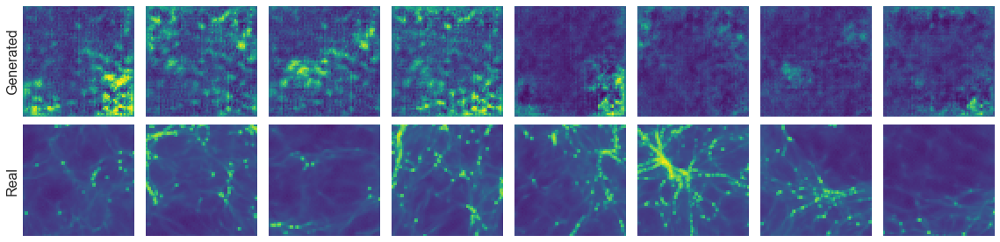

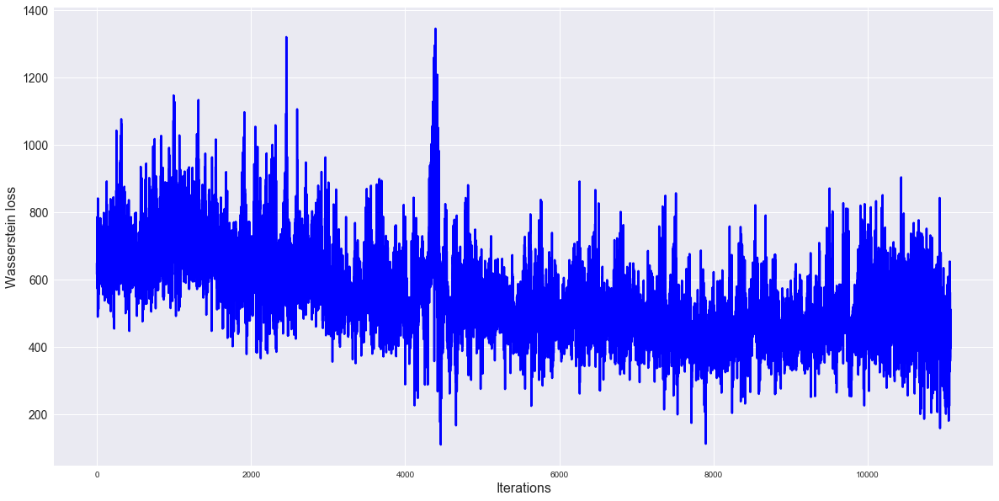

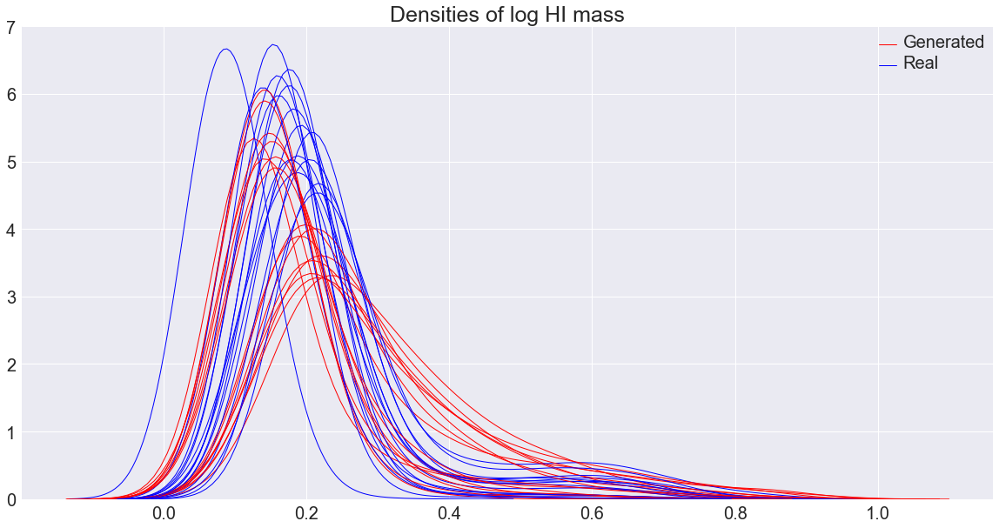

In [13]:
            with torch.no_grad():
                fake = netG(Variable(fixed_noise), fixed_label)
                fake = np.array(fake)
                real_cpu = np.array(real_cpu)

            visualize2d(np.array(real_cpu), np.array(fake), log= False, save='')
            #hist_plot(np.array(fake), np.array(real_cpu), log_plot=False, redshift_fig_folder='') 
            
            #plot_power_spec2((np.exp(real_cpu * max_l5) -1),(np.exp(fake * max_l5) -1), mean_5, (75.0/2048.0)*s_sample)
            plot_loss(wass_loss,'Wasserstein loss', log_=False)
            
            #visualize2d(np.exp(np.array(real_cpu))*, np.exp(np.array(fake))*max_5, save='')
            #plot_loss(wass_loss,'Wasserstein loss', log_=False)
            
            plot_densities(fake, real_cpu, 16, log_=False)
            
            torch.save(netG.state_dict(), '{0}/netG_epoch_{1}.pth'.format(experiment, epoch))
            torch.save(netD.state_dict(), '{0}/netD_epoch_{1}.pth'.format(experiment, epoch))